<a id='Title'></a>
<h1 style="color:#ffffff; background-color:#001f3f; padding: 20px 0; text-align: center; font-weight: bold;">FIRST PICK: BUILDING A CLUSTERED TALENT POOL FOR TRANSFERS AND FREE AGENT ACQUISITIONS</h1><a id='ExecSum'></a><a id='Title'></a><a id='Title'></a>

<a id='Header1'></a>
<h1 style="color:#ffffff; background-color:#001f3f; padding: 20px 0; text-align: left; font-weight: bold; padding-left: 20px;">IMPORTS: PACKAGES USED</h1><a id='ExecSum'></a><a id='Title'></a><a

In [1]:
pip install fastcluster

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import (calinski_harabasz_score,
                             davies_bouldin_score,
                             silhouette_score,)
from sklearn.base import clone
from scipy.spatial.distance import euclidean, cityblock
import scipy.spatial.distance as distance
import sqlite3
import warnings
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn_extra.cluster import KMedoids
from scipy.cluster.hierarchy import dendrogram, linkage
import fastcluster
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import OPTICS, cluster_optics_dbscan
warnings.filterwarnings("ignore")

<a id='Header2'></a>
<h1 style="color:#ffffff; background-color:#001f3f; padding: 20px 0; text-align: left; font-weight: bold; padding-left: 20px;">FUNCTIONS</h1><a id='ExecSum'></a><a id='Title'></a><a

<h2 style="color: navy;">A. Exploratory Data Analysis</h2>

In [3]:
def plot_scoring_stats(scoring_stats, title):
    """
    Plot all scoring statistics as box plots in a single figure.
    """
    scoring_stats_melted = scoring_stats.melt(
        var_name='Statistic', value_name='Value')
    navy_blue_palette = ["#87CEEB"] * len(scoring_stats.columns)

    plt.figure(figsize=(20, 8))
    sns.boxplot(x='Statistic', y='Value',
                data=scoring_stats_melted, palette=navy_blue_palette)
    plt.xticks(rotation=45)  # Rotate the x labels for better readability
    plt.title(title, fontsize=20)
    plt.xlabel('Scoring Attribute', fontsize=14)
    plt.ylabel('Attribute Rating', fontsize=14)
    plt.tight_layout()
    plt.show()


def plot_passing_stats(passing_stats, fig_num):
    """
    Plot distribution of passing statistics
    """
    plt.figure(figsize=(18, 12))

    plt.suptitle(
        f"Figure {fig_num}. Passing Statistics", fontsize=20, y=0.97)

    plt.subplot(2, 2, 1)
    sns.histplot(passing_stats['crossing'], kde=True,
                 color='b', edgecolor='black')
    plt.title(f'Figure {fig_num}A: Crossing Distribution')
    plt.xlabel('Attribute Rating')
    plt.ylabel('Frequency')

    plt.subplot(2, 2, 2)
    sns.histplot(passing_stats['short_passing'],
                 kde=True, color='b', edgecolor='black')
    plt.title(f'Figure {fig_num}B: Short Passing Distribution')
    plt.xlabel('Attribute Rating')
    plt.ylabel('Frequency')

    plt.subplot(2, 2, 3)
    sns.histplot(passing_stats['long_passing'],
                 kde=True, color='b', edgecolor='black')
    plt.title(f'Figure {fig_num}C: Long Passing Distribution')
    plt.xlabel('Attribute Rating')
    plt.ylabel('Frequency')

    plt.subplot(2, 2, 4)
    sns.histplot(passing_stats['vision'], kde=True,
                 color='b', edgecolor='black')
    plt.title(f'Figure {fig_num}D: Vision Distribution')
    plt.xlabel('Attribute Rating')
    plt.ylabel('Frequency')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


def plot_off_skillIQ_stats(off_skillIQ_stats, fig_num):
    """
    Plot distribution of offensive skills/IQ statistics
    """
    plt.figure(figsize=(18, 8))

    plt.suptitle(
        f"Figure {fig_num}. Offensive Skills/IQ Statistics",
        fontsize=20, y=0.97)

    plt.subplot(1, 3, 1)
    sns.histplot(off_skillIQ_stats['dribbling'],
                 kde=True, color='b', edgecolor='black')
    plt.title(f'Figure {fig_num}A: Dribbling')
    plt.xlabel('Attribute Rating')
    plt.ylabel('Frequency')

    plt.subplot(1, 3, 2)
    sns.histplot(off_skillIQ_stats['ball_control'],
                 kde=True, color='b', edgecolor='black')
    plt.title(f'Figure {fig_num}B: Ball Control')
    plt.xlabel('Attribute Rating')
    plt.ylabel('Frequency')

    plt.subplot(1, 3, 3)
    sns.histplot(off_skillIQ_stats['positioning'],
                 kde=True, color='b', edgecolor='black')
    plt.title(f'Figure {fig_num}C: Positioning')
    plt.xlabel('Attribute Rating')
    plt.ylabel('Frequency')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


def plot_def_stats(def_stats, fig_num):
    """
    Plot distribution of defensive statistics
    """
    plt.figure(figsize=(18, 8))

    plt.suptitle(
        f"Figure {fig_num}. Defensive Statistics", fontsize=20, y=0.97)

    plt.subplot(1, 3, 1)
    sns.histplot(def_stats['interceptions'], kde=True,
                 color='b', edgecolor='black')
    plt.title(f'Figure {fig_num}A: Interceptions')
    plt.xlabel('Attribute Rating')
    plt.ylabel('Frequency')

    plt.subplot(1, 3, 2)
    sns.histplot(def_stats['standing_tackle'],
                 kde=True, color='b', edgecolor='black')
    plt.title(f'Figure {fig_num}B: Standing Tackle')
    plt.xlabel('Attribute Rating')
    plt.ylabel('Frequency')

    plt.subplot(1, 3, 3)
    sns.histplot(def_stats['sliding_tackle'], kde=True,
                 color='b', edgecolor='black')
    plt.title(f'Figure {fig_num}C: Sliding Tackle')
    plt.xlabel('Attribute Rating')
    plt.ylabel('Frequency')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


def plot_def_skillIQ_stats(def_skillIQ_stats, fig_num):
    """
    Plot distribution of defensive skills/IQ statistics
    """
    plt.figure(figsize=(18, 8))

    plt.suptitle(
        f"Figure {fig_num}. Defensive Skills / IQ Statistics",
        fontsize=20, y=0.97)

    plt.subplot(1, 2, 1)
    sns.histplot(def_skillIQ_stats['aggression'],
                 kde=True, color='b', edgecolor='black')
    plt.title(f'Figure {fig_num}A: Aggression')
    plt.xlabel('Attribute Rating')
    plt.ylabel('Frequency')

    plt.subplot(1, 2, 2)
    sns.histplot(def_skillIQ_stats['marking'],
                 kde=True, color='b', edgecolor='black')
    plt.title(f'Figure {fig_num}B: Marking')
    plt.xlabel('Attribute Rating')
    plt.ylabel('Frequency')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


def plot_physical_stats(stats, fig_num):
    """
    Plot all physical statistics as box plots in a single figure.
    """
    physical_stats_melted = stats.melt(
        var_name='Statistic', value_name='Value')
    navy_blue_palette = ["#87CEEB"] * len(stats.columns)

    plt.figure(figsize=(20, 8))
    sns.boxplot(x='Statistic', y='Value',
                data=physical_stats_melted,
                palette=navy_blue_palette)
    plt.xticks(rotation=45)
    plt.title(f'Figure {fig_num}. Physical Statistics Box Plots',
              fontsize=20)
    plt.xlabel('Physical Attribute', fontsize=14)
    plt.ylabel('Attribute Rating', fontsize=14)
    plt.tight_layout()
    plt.show()

<h2 style="color: navy;">B. Model Implementation</h2>

<h3 style="color: navy;">B.1 Internal Validation Statistics Functions</h3>

In [4]:
def pooled_within_ssd(X, y, centroids, dist):
    """
    Compute pooled within-cluster sum of squares around the cluster mean
    """
    # COMBINE X AND LABELS
    X_new = pd.DataFrame(X)
    X_new[len(X_new.columns)] = y

    # COMBINE CENTROIDS AND LABELS
    cent_new = pd.DataFrame(centroids)
    labels = np.unique(y)
    cent_new[len(cent_new.columns)] = labels

    # COMPUTE FOR DISTANCES
    cumulative = 0
    for label in labels:
        array1 = X_new[X_new.iloc[:, -1]
                       == label].iloc[:, :-1].to_numpy()
        array2 = cent_new[cent_new.iloc[:, -1]
                          == label].iloc[:, :-1].to_numpy()
        distances = np.square(distance.cdist(
            array1, array2, metric=dist)) * 1/(2*array1.shape[0])
        cumulative += distances.sum()
    return cumulative

# Realization Generator


def gen_realizations(X, b, random_state=None):
    """
    Generate b random realizations of X

    The realizations are drawn from a uniform 
    distribution over the range of
    observed values for that feature.
    """
    mins = X.min(axis=0)
    maxs = X.max(axis=0)
    rng = np.random.default_rng(random_state)
    nrows, ncols = X.shape
    return rng.uniform(
        np.tile(mins, (b, nrows, 1)),
        np.tile(maxs, (b, nrows, 1)),
        size=(b, nrows, ncols),
    )

# Gap Statistics


def gap_statistic(X, y, centroids, dist, b, clusterer, random_state=None):
    """
    Compute the gap statistic
    """
    X_refs = gen_realizations(X, b, random_state)
    wk = pooled_within_ssd(X, y, centroids, dist)

    cum_gap = 0
    gaps = []
    for data in X_refs:
        cluster_data = clusterer.fit(data)
        wki = pooled_within_ssd(data, cluster_data.labels_,
                                cluster_data.cluster_centers_, dist)
        gap_i = np.log(wki) - np.log(wk)
        cum_gap += gap_i
        gaps.append(gap_i)

    return [cum_gap/b, np.std(gaps)]

# Generate Statistics


def cluster_range(X, clusterer, k_start, k_stop):
    """
    Cluster X for different values of k
    """

    ys = []
    centers = []
    inertias = []
    chs = []
    scs = []
    dbs = []
    gss = []
    gssds = []
    for k in range(k_start, k_stop + 1):
        clusterer_k = clone(clusterer)
        clusterer_k.set_params(n_clusters=k)
        cluster_data = clusterer_k.fit(X)
        y = clusterer_k.fit_predict(X)
        ys.append(y)
        centers.append(clusterer_k.cluster_centers_)
        inertias.append(cluster_data.inertia_)
        chs.append(calinski_harabasz_score(X, y))
        scs.append(silhouette_score(X, y))
        dbs.append(davies_bouldin_score(X, y))
        # raise NotImplementedError()
        gs = gap_statistic(
            X,
            y,
            clusterer_k.cluster_centers_,
            euclidean,
            5,
            clone(clusterer).set_params(n_clusters=k),
            random_state=1337,
        )
        gss.append(gs[0])
        gssds.append(gs[1])
    result_dict = {
        "ys": ys,
        "centers": centers,
        "inertias": inertias,
        "chs": chs,
        "scs": scs,
        "dbs": dbs,
        "gss": gss,
        "gssds": gssds,
    }
    return result_dict

# Plot Statistics


def plot_internal(inertias, chs, scs, dbs, gss, gssds, title):
    """Plot internal validation values"""
    fig, ax = plt.subplots()
    ks = np.arange(2, len(inertias) + 2)
    ax.plot(ks, inertias, "-o", label="SSE")
    ax.plot(ks, chs, "-ro", label="CH")
    ax.set_xlabel("$k$")
    ax.set_ylabel("SSE/CH")
    lines, labels = ax.get_legend_handles_labels()
    ax2 = ax.twinx()
    ax2.errorbar(ks, gss, gssds, fmt="-go",
                 label="Gap statistic")
    ax2.plot(ks, scs, "-ko", label="Silhouette coefficient")
    ax2.plot(ks, dbs, "-gs", label="DB")
    ax2.set_ylabel("Gap statistic/Silhouette/DB")
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.legend(lines + lines2, labels + labels2)
    plt.title(title)
    return ax


def axis_plot(res, fig_num):
    """
    Plot all internal validation 
    statistics in separate axes
    """
    player_stats = pd.DataFrame(res_player)
    player_stats['k'] = np.arange(2, 16)
    player_stats = player_stats.set_index('k')

    figure_letter = ['A', 'B', 'C', 'D', 'E']

    headers = ['SSE', 'Calinski-Harabasz Index',
               'Silhoutte Coefficient', 'Davies-Bouldin Index',
               'Gap Statistic']

    fig, axs = plt.subplots(2, 3, figsize=(15, 10))
    axs = axs.flatten()
    plt.suptitle(
        f"Figure {fig_num}. Internal Validation Statistics for Kmeans",
        fontsize=20, y=1)

    for i, stat in enumerate(player_stats.iloc[:, 2:-1].columns):
        axs[i].plot(player_stats.index, player_stats[stat],
                    marker='o')
        axs[i].set_title(f'Figure {fig_num}{figure_letter[i]}. {headers[i]}')
        axs[i].set_xlabel('k')
        axs[i].set_ylabel(stat)

    if len(player_stats.iloc[:, 2:-1].columns) < len(axs):
        for ax in axs[len(player_stats.iloc[:, 2:-1].columns):]:
            ax.set_visible(False)

    plt.tight_layout()
    plt.show()

<h3 style="color: navy;">B.2 Dimensionality Reduction Functions</h3>

In [5]:
def plot_ve(variance_explained, title):
    """
    Plot variance explained and cumulative variance explained
    """
    fig, ax = plt.subplots()
    ax.set_title(title)
    ax.plot(range(1, len(variance_explained)+1),
            variance_explained, '-', label='individual')
    ax.set_xlim(0, len(variance_explained)+1)
    ax.set_xlabel('PCs')
    ax.set_ylabel('variance explained')
    ax = ax.twinx()
    ax.plot(range(1, len(variance_explained)+1),
            variance_explained.cumsum(), 'r-', label='cumulative')
    ax.axhline(0.81, ls='--', color='g')
    ax.axvline(5, ls='--', color='g')
    ax.set_ylabel('cumulative variance explained');

<h3 style="color: navy;">B.3 Model Functions</h3>

In [6]:
def run_kmeans(X, clusters, title):
    """
    Run Kmeans and return clusters and KMeans Classifier
    """
    kmeans_player = KMeans(n_clusters=clusters,
                           random_state=1337, n_init='auto')
    clusters = kmeans_player.fit_predict(X)

    # Plot the clusters
    plt.figure(figsize=(10, 6))
    unique_labels = set(clusters)
    colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_labels)))
    for k, col in zip(unique_labels, colors):
        class_member_mask = (clusters == k)
        plt.scatter(X_player_new[class_member_mask, 0],
                    X_player_new[class_member_mask, 1],
                    color=col, edgecolor='black', s=50,
                    label=f'Cluster {k}')

    # Plot the centroids
    centroids = kmeans_player.cluster_centers_
    plt.scatter(centroids[:, 0], centroids[:, 1], s=200,
                c='black', alpha=1, label='Centroids',
                marker='X')

    plt.title(title)
    plt.xlabel('PCA Feature 1')
    plt.ylabel('PCA Feature 2')
    plt.legend()

    return kmeans_player, clusters


def run_heirarchical(X, method, title):
    """
    Return dendrogram of chosen 
    heirarchical clustering method
    """
    Z = fastcluster.linkage(X, method=method)
    fig, ax = plt.subplots()
    dn = dendrogram(Z, ax=ax, p=20,
                    truncate_mode='lastp',)
    ax.set_ylabel(r"$h$")
    plt.title(title)


def plot_clustered_points(X, c, method, title):
    """
    Plot clustered data points using 
    agglomerative clustering method
    """
    agg = AgglomerativeClustering(
        n_clusters=c, linkage=method, distance_threshold=None
    )
    clusters = agg.fit_predict(X)

    # Plot the clusters
    plt.figure(figsize=(10, 6))
    unique_labels = set(clusters)
    colors = plt.cm.rainbow(np.linspace(0, 1,
                                        len(unique_labels)))
    for k, col in zip(unique_labels, colors):
        class_member_mask = (clusters == k)
        plt.scatter(X_player_new[class_member_mask, 0],
                    X_player_new[class_member_mask, 1],
                    color=col, edgecolor='black', s=50,
                    label=f'Cluster {k}')

    plt.title(title)
    plt.xlabel('PCA Feature 1')
    plt.ylabel('PCA Feature 2')
    plt.legend()
    plt.show()


def reachibility_plot(X, title):
    """
    Generate reachability plot and return optics class
    """
    optics = OPTICS(min_samples=4, cluster_method="dbscan")
    optics.fit(X)
    plt.plot(optics.reachability_[optics.ordering_], ".-")
    plt.title(title)
    plt.ylabel("reachability")

    return optics


def plot_optics_points(optics, thres, title):
    """
    Plot data points after clustering using OPTICS-DBSCAN
    """
    clusters = cluster_optics_dbscan(
        reachability=optics.reachability_,
        core_distances=optics.core_distances_,
        ordering=optics.ordering_,
        eps=thres,
    )

    print("Number of clusters:", clusters.max() + 1)
    print("Number of noise points:", (clusters == -1).sum())
    print(
        "Number of points in the largest cluster:",
        np.bincount(clusters[clusters >= 0]).max(),
    )
    print("Number of points:", len(clusters))
    print("Silhouette score:",
          silhouette_score(X_player_new, clusters))

    # Plot the clusters
    plt.figure(figsize=(10, 6))
    unique_labels = set(clusters)
    colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_labels)))
    for k, col in zip(unique_labels, colors):
        class_member_mask = (clusters == k)
        plt.scatter(X_player_new[class_member_mask, 0],
                    X_player_new[class_member_mask, 1],
                    color=col, edgecolor='black', s=50,
                    label=f'Cluster {k}')

    plt.title(title)
    plt.xlabel('PCA Feature 1')
    plt.ylabel('PCA Feature 2')
    plt.legend()
    plt.show()


def run_kmedoids(X, clusters, title):
    """
    Return clusters and Kmedoids class
    """
    kmedoids_player = KMedoids(n_clusters=clusters,
                               random_state=1337)
    clusters = kmedoids_player.fit_predict(X_player_new)

    # Plot the clusters
    plt.figure(figsize=(10, 6))
    unique_labels = set(clusters)
    colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_labels)))
    for k, col in zip(unique_labels, colors):
        class_member_mask = (clusters == k)
        plt.scatter(X_player_new[class_member_mask, 0],
                    X_player_new[class_member_mask, 1],
                    color=col, edgecolor='black', s=50,
                    label=f'Cluster {k}')

    # Plot the centroids
    centroids = kmedoids_player.cluster_centers_
    plt.scatter(centroids[:, 0], centroids[:, 1], s=200,
                c='black', alpha=1, label='Centroids', marker='X')

    plt.title(title)
    plt.xlabel('PCA Feature 1')
    plt.ylabel('PCA Feature 2')
    plt.legend()
    plt.show()

    return kmedoids_player, clusters

<a id='Report_Header'></a>
<h1 style="color:#ffffff; background-color:#000000; padding: 20px 0; text-align: center; font-weight: bold;">-- START OF TECHNICAL REPORT --</h1><a id='ExecSum'></a><a id='Title'></a><a id='Title'></a>

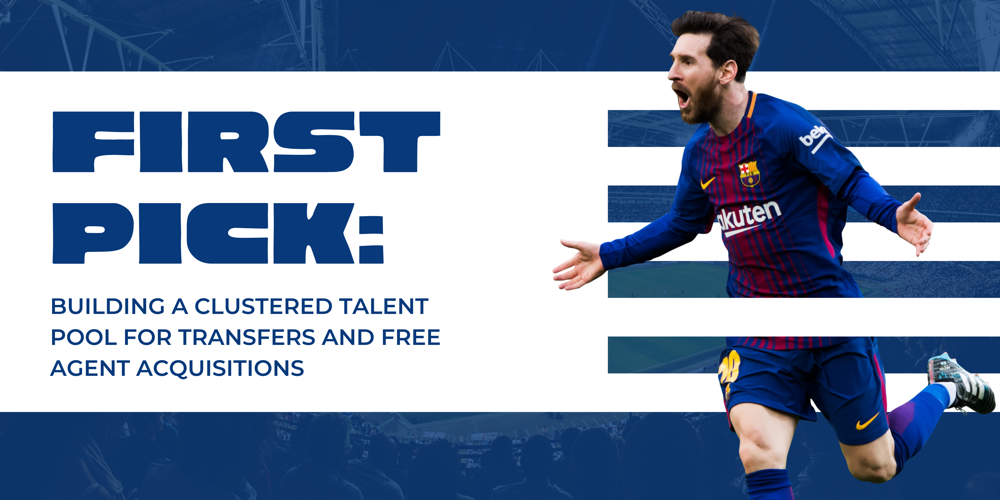

<a id='Header2'></a>
<h1 style="color:#ffffff; background-color:#001f3f; padding: 20px 0; text-align: left; font-weight: bold; padding-left: 20px;">I. ABSTRACT</h1><a id='ExecSum'></a><a id='Title'></a><a

In the changing landscape of football, the move towards a positionless framework requires a reassessment of traditional player evaluation and team composition approaches. This transformation challenges the conventional wisdom of fixed player roles, emphasizing the need for versatility and adaptability. Given this transformative shift, it becomes evident why traditional player databases and scouting methods, which rely on rigid positional labels, are increasingly inadequate for capturing the complexity of modern football's demands.

With this perspective in mind, the objective of the project is to reorganize the player pool within the transfer market to pinpoint specific players desirable for acquisition or development by the team. This has implications for coaching, scouting, and player development. The study utilizes data clustering techniques to move beyond traditional categorizations and gain a deeper understanding of player abilities in a comprehensive manner. Traditional player databases and scouting methods are inadequate in accurately categorizing players for a positionless game, as they heavily rely on positional labels that fail to fully encompass the multifaceted skills demanded in modern football.

To delve deeper into the utilization of data clustering, the team adopted a three-step methodology. Initially, dimensionality reduction was applied to the dataset, followed by testing multiple clustering techniques to identify the most suitable method. Lastly, cluster analysis involved visualizing clustered data points on principal components and conducting centroid analysis. All these steps were undertaken with the aim of offering additional insights into the transfer market.

Following the methodology, it was determined that KMeans offers the optimal clustering of the player pool based on heuristics and validation statistics. The findings signal a paradigm shift in talent identification and development, prompting football teams and scouting departments to adopt a more nuanced approach aligned with the inherent demands of positionless play. Moreover, the results suggest the presence of players in the pool who can bridge the gap, either as flexible individuals capable of developing into offensive or defensive specialists, or as unicorns who excel in all aspects of the game.


Based on the findings, the team suggests that football teams and scouting departments adapt their talent identification and development strategies to prioritize cultivating versatile skills in alignment with the demands of positionless play. Future research should explore predictive models for identifying potential positionless players and the impact of specific training programs on developing the requisite skills for this innovative approach to football. Additionally, addressing limitations such as data challenges, lack of qualitative information, and time constraints, future researchers are encouraged to collect generational data, explore alternative use cases, expand datasets, and collaborate with subject matter experts.

<a id='Header2'></a>
<h1 style="color:#ffffff; background-color:#001f3f; padding: 20px 0; text-align: left; font-weight: bold; padding-left: 20px;">II. PROJECT OBJECTIVES AND PURPOSE</h1><a id='ExecSum'></a><a id='Title'></a><a

<h2 style="color: navy;">A. Problem Statement</h2>

How can sophisticated analytical methods, such as data clustering techniques, be leveraged to organize the diverse pool of players in the transfer and free agent market? This organization can act as a valuable resource for scouting, coaching, and player development personnel, aiding in the identification of appropriate acquisitions and substitutes, as well as guiding training and development efforts on the field.

<h2 style="color: navy;">B. Motivation</h2>

In the evolving landscape of football, where tactical flexibility and player versatility have become paramount, the concept of positionless play is gaining ground as a revolutionary approach to the game. This shift represents a departure from traditional, rigid positional roles towards a more fluid and dynamic strategy, where players are valued for their comprehensive skill sets rather than their ability to perform in a single, defined position. The motivation for this study emerges from the need to adapt to and capitalize on this paradigm shift, employing advanced data analytics to navigate the complexities of assembling a team that embodies the principles of positionless football.
 
At the core of this transformation is the realization that traditional databases and scouting methods may not fully capture the multifaceted attributes required for players to thrive in a positionless system. This gap in the scouting process presents a unique challenge: how to identify and cluster players based on a holistic view of their skills, beyond the conventional positional labels. By leveraging a players' database and employing sophisticated clustering techniques, this study aims to categorize athletes not by the positions they have historically occupied, but by the diverse attributes they bring to the game. This approach seeks to unveil the latent potential within players, highlighting those whose versatility and skill diversity make them ideal candidates for a positionless football strategy.
 
The overarching motivation of this research is to bridge the gap between traditional player evaluation methods and the strategic needs of modern football. By constructing a clustered talent pool that aligns with the principles of positionless play, this study aspires to provide teams with the insights needed to build versatile, adaptable rosters.

<a id='Header2'></a>
<h1 style="color:#ffffff; background-color:#001f3f; padding: 20px 0; text-align: left; font-weight: bold; padding-left: 20px;">III. PROJECT OVERVIEW</h1><a id='ExecSum'></a><a id='Title'></a><a

<center><b>Figure 1. </b>Project Overview</center><center>

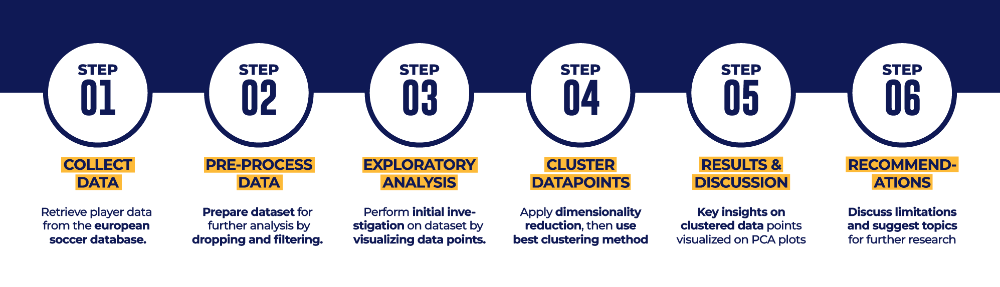

The project's aim is to categorize players based on attributes like scoring, passing, defensive, and physical statistics, providing a valuable resource for scouting, coaching, and player development. To achieve this, the team will initiate data collection from the extensive European Soccer database stored in the Asian Institute of Management's supercomputer. This database holds comprehensive information on teams and players.

Following data gathering, the team will preprocess the data, focusing on selecting pertinent player data points and eliminating irrelevant features or entries. With the refined dataset, the team will conduct exploratory analysis to gain initial insights, which will inform the final methodology.

Next, the team will proceed to the core of the project: implementing the most suitable clustering method to group similar data points. Prior to clustering, dimensionality reduction techniques, particularly PCA, will be employed to streamline the data.

Once clustering is complete, the team will analyze and discuss key insights derived from visualizing the data points. Additionally, the report will acknowledge its limitations and propose areas for further research and consideration (Refer to Figure 1).

<center><b>Table 1. </b> Project Pipeline</center>

||<center>Step</center>|<center>Detailed Description</center>| 
|:---|:---|:---|
|`1`|Data Collection | The dataset utilized in this project was obtained directly from the repository of datasets stored within the Asian Institute of Management's supercomputer, known as 'Jojie'. Specifically, the selected dataset originates from the European Soccer database, containing player information and statistics sourced from EA's FIFA video game. The data reflects updates made up to the years 2015 and 2016. |
|`2`|Data Pre-Processing| After acquiring the data, the team prioritized obtaining the latest player information to ensure the analysis was conducted on up-to-date data. Following this, the team filtered out goalkeepers by setting a threshold to retrieve only players with a gk_reflexes rating of 37 and below, focusing solely on outfield players. Subsequently, the dataset underwent further refinement to remove unnecessary features that could potentially affect the analysis, such as columns or rows containing input errors or null values. This meticulous cleaning process ensured the dataset was ready for subsequent analysis and modeling, streamlining the workflow for the project.|
|`3`|Data Exploration| In this section, the team conducted a preliminary investigation of the dataset by creating visualizations of each player feature utilized in the project. The analysis was categorized into Offensive Attributes, Defensive Attributes, and Physical Attributes, representing the most high-level segmentation. The team utilized a combination of box plots and histograms to illustrate the distributions of these attributes. Additionally, each graph included detailed discussions and insights to provide further understanding of the data. |
|`4`|Clustering Data Points| The project's main objective is to group players based on similar attributes. This section directly tackles this goal by initiating dimensionality reduction using PCA to streamline the dataset for modeling and visualization. The team then examined different clustering techniques to identify the most effective approach. |
|`5`|Results and Discussion| After choosing the most suitable model and applying it to the dataset, the team discussed significant findings that were linked to the business objective. These insights were gleaned from an analysis of the latent features indicated by PCA on the clustered data points, as well as the centroids generated by our selected clustering method.|
|`6`|Recommendations|The report recognizes and addresses constraints that affected the team's ability to expand results and outputs. Given these limitations, the team identifies potential directions for future studies. These opportunities include: (1) collecting player data across different generations, (2) exploring new applications, (3) widening the scope to include international leagues beyond Europe, and (4) collaborating with experts to gain richer insights supported by their experiences. |

The project pipeline provides a detailed outline of the team's strategy for the entire project, covering everything from gathering data to suggesting further research. It offers a thorough explanation of each stage, including sub-steps to ensure a complete understanding of the process (See Table 1 for details).

<a id='Header2'></a>
<h1 style="color:#ffffff; background-color:#001f3f; padding: 20px 0; text-align: left; font-weight: bold; padding-left: 20px;">IV. DATA COLLECTION</h1><a id='ExecSum'></a><a id='Title'></a><a

<h2 style="color: navy;">A. Data Source</h2>

European Soccer Database

The dataset contains 11,064 entries and 44 columns, providing a comprehensive view of player attributes in various aspects such as technical skills, physical attributes, and playing styles. 

The dataset is available on Jojie:<br>
<font color='blue'>/mnt/data/public/european-soccer/database.sqlite<br></font>


<h2 style="color: navy;">B. Metadata and Data Descriptions</h2>

<html>
<center><b>Table 2. </b> Dataset Metadata</center><center>
<table border="1" class="dataframe">
  <thead>
    <tr style="text-align: right;">
      <th>Feature Name</th>
      <th>Feature Description</th>
      <th>Sample Record</th>
      <th>Data Type</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td>player_api_id</td>
      <td>Unique identifier for the player in the API</td>
      <td>2625</td>
      <td>integer</td>
    </tr>
    <tr>
      <td>player_name</td>
      <td>Full name of the player</td>
      <td>Patryk Rachwal,18</td>
      <td>string</td>
    </tr>
    <tr>
      <td>id</td>
      <td>Unique identifier for the record</td>
      <td>139844</td>
      <td>integer</td>
    </tr>
    <tr>
      <td>player_fifa_api_id</td>
      <td>Unique identifier for the player in FIFA API</td>
      <td>148544</td>
      <td>integer</td>
    </tr>
    <tr>
      <td>player_api_id.1</td>
      <td>skill attribiute of the player</td>
      <td>2625</td>
      <td>integer</td>
    </tr>
    <tr>
      <td>date</td>
      <td>Date of the record entry</td>
      <td>2015-01-16 00:00:00</td>
      <td>string</td>
    </tr>
    <tr>
      <td>overall_rating</td>
      <td>FIFA overall rating of the player</td>
      <td>61.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>potential</td>
      <td>FIFA potential rating of the player</td>
      <td>61.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>preferred_foot</td>
      <td>Preferred foot of the player</td>
      <td>right</td>
      <td>string</td>
    </tr>
    <tr>
      <td>attacking_work_rate</td>
      <td>Work rate in attacking phase</td>
      <td>medium</td>
      <td>string</td>
    </tr>
    <tr>
      <td>defensive_work_rate</td>
      <td>Work rate in defensive phase</td>
      <td>medium</td>
      <td>string</td>
    </tr>
    <tr>
      <td>crossing</td>
      <td>Crossing skill attribiute of the player</td>
      <td>50.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>finishing</td>
      <td>Finishing skill attribiute of the player</td>
      <td>47.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>heading_accuracy</td>
      <td>Heading skill attribiute of the player</td>
      <td>46.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>short_passing</td>
      <td>Short passing skill attribiute of the player</td>
      <td>52.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>volleys</td>
      <td>Volleys skill attribiute of the player</td>
      <td>39.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>dribbling</td>
      <td>Dribbling skill attribiute of the player</td>
      <td>50.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>curve</td>
      <td>Curve skill attribiute of the player</td>
      <td>51.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>free_kick_accuracy</td>
      <td>Free kick skill attribiute of the player</td>
      <td>50.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>long_passing</td>
      <td>Long passing skill attribiute of the player</td>
      <td>64.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>ball_control</td>
      <td>Ball control skill attribiute of the player</td>
      <td>62.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>acceleration</td>
      <td>Acceleartion skill attribiute of the player</td>
      <td>67.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>sprint_speed</td>
      <td>Sprint skill attribiute of the player</td>
      <td>63.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>agility</td>
      <td>Agility skill attribiute of the player</td>
      <td>74.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>reactions</td>
      <td>Reactions skill attribiute of the player</td>
      <td>49.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>balance</td>
      <td>Balance skill attribiute of the player</td>
      <td>76.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>shot_power</td>
      <td>Shot power skill attribiute of the player</td>
      <td>68.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>jumping</td>
      <td>Jumping skill attribiute of the player</td>
      <td>63.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>stamina</td>
      <td>Stamina skill attribiute of the player</td>
      <td>77.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>strength</td>
      <td>Strength skill attribiute of the player</td>
      <td>56.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>long_shots</td>
      <td>Long shots skill attribiute of the player</td>
      <td>54.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>aggression</td>
      <td>Aggression skill attribiute of the player</td>
      <td>71.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>interceptions</td>
      <td>Interceptions skill attribiute of the player</td>
      <td>64.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>positioning</td>
      <td>Positioning skill attribiute of the player</td>
      <td>49.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>vision</td>
      <td>Vision skill attribiute of the player</td>
      <td>55.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>penalties</td>
      <td>Penalties skill attribiute of the player</td>
      <td>66.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>marking</td>
      <td>Marking skill attribiute of the player</td>
      <td>62.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>standing_tackle</td>
      <td>Standing tackle skill attribiute of the player</td>
      <td>63.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>sliding_tackle</td>
      <td>Sliding tackle skill attribiute of the player</td>
      <td>54.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>gk_diving</td>
      <td>Goal keeping diving skill attribiute of the player</td>
      <td>12.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>gk_handling</td>
      <td>Goal keeping handling skill attribiute of the player</td>
      <td>11.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>gk_kicking</td>
      <td>Goal keeping kick skill attribiute of the player</td>
      <td>6.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>gk_positioning</td>
      <td>Goal keeping positioning skill attribute of the player</td>
      <td>8.0</td>
      <td>float</td>
    </tr>
    <tr>
      <td>gk_reflexes</td>
      <td>Goal keeping reflxes skill attribute of the player</td>
      <td>8.0</td>
      <td>float</td>
    </tr>
  </tbody>
</table>
</html>

The main categories of features in the dataset can be described as follows (Refer to Table 2):

1. **Identification Features**: These include `player_api_id`, `player_name`, `id`, and `player_fifa_api_id`, which serve as unique identifiers for players in various databases and can be used to link this data with other sources.

2. **Temporal Feature**: The `date` column indicates the time at which the player's information was recorded, allowing for temporal analysis of player development and performance over time.

3. **Performance Ratings**: `overall_rating` and `potential` provide a snapshot of a player's current abilities and their potential to improve, which are key for evaluating the player's value and future performance.

4. **Player Preferences and Work Rates**: `preferred_foot`, `attacking_work_rate`, and `defensive_work_rate` reflect personal player traits and their style of play, which could influence their role on the team.

5. **Skill Attributes**: A wide range of skill attributes, from `crossing` to `gk_reflexes`, quantify specific aspects of a player's capabilities. These include both outfielder skills (like passing, dribbling, speed, and tackling) and goalkeeper skills (like diving and handling).

### Removed Features

In preparing the dataset for a focused study on clustering outfielder skills, several features have been removed to eliminate irrelevant data and minimize potential biases. Identification and general information attributes like `date`, `id`, and `player_fifa_api_id` were excluded as they do not contribute to the analysis of outfield skills. General performance metrics such as `overall_rating`, and `potential` were also omitted to prevent skewing the evaluation of outfield players. Goalkeeping-specific skills (`gk_handling`, `gk_kicking`, `gk_positioning`, `gk_reflexes`, `gk_diving`) were naturally removed since they are not applicable to outfield players. Lastly, subjective features like `preferred_foot`, `attacking_work_rate`, and `defensive_work_rate` were left out to ensure the clustering focuses purely on objective skill attributes, thus fostering a more accurate and unbiased grouping of outfielder talents (Refer to Table 3).


<center><b>Table 3. </b> Removed Features</center><center>
<table>
  <tr>
    <th>Feature Name</th>
    <th>Feature Description</th>
  </tr>
  <tr>
    <td>date</td>
    <td>Date of the record entry</td>
  </tr>
  <tr>
    <td>id</td>
    <td>Unique identifier for the record</td>
  </tr>
  <tr>
    <td>player_fifa_api_id</td>
    <td>Unique identifier for the player in FIFA API</td>
  </tr>
  <tr>
    <td>player_fifa_api_id</td>
    <td>Unique identifier for the player in FIFA API</td>
  </tr>
  <tr>
    <td>overall_rating</td>
    <td>FIFA overall rating of the player</td>
  </tr>
    <tr>
    <td>preferred_foot</td>
    <td>Preferred foot of the player</td>
  </tr>
  </tr>
    <tr>
    <td>gk_handling</td>
    <td>Goal keeping handling skill attribute of the player</td>
  </tr>
  </tr>
    <tr>
    <td>gk_kicking</td>
    <td>Goal keeping kicking skill attribute of the player</td>
  </tr>
  </tr>
    <tr>
    <td>gk_positioning</td>
    <td>Goal keeping positioning skill attribute of the player</td>
  </tr>
  </tr>
    <tr>
    <td>gk_reflexes</td>
    <td>Goal keeping reflxes skill attribute of the player</td>
  </tr>
  </tr>
    <tr>
    <td>gk_diving</td>
    <td>Goal keeping diving skill attribute of the player</td>
  </tr>
  </tr>
    <tr>
    <td>potential</td>
    <td>FIFA potential rating of the player</td>
  </tr>
  </tr>
    <tr>
    <td>overall_rating</td>
    <td>FIFA overall rating of the player</td>
  </tr>
  </tr>
    <tr>
    <td>attacking_work_rate</td>
    <td>Work rate in attacking phase</td>
  </tr></tr>
    <tr>
    <td>defensive_work_rate</td>
    <td>Work rate in defensive phase</td>
  </tr>
</table>

<a id='Header2'></a>
<h1 style="color:#ffffff; background-color:#001f3f; padding: 20px 0; text-align: left; font-weight: bold; padding-left: 20px;">V. DATA PRE-PROCESSING</h1><a id='ExecSum'></a><a id='Title'></a><a

<h2 style="color: navy;">A. Load Data</h2>

Data is sourced from the European soccer database, with a rule implemented to consider only the most recent player ratings. This is achieved by extracting the latest recorded date for each player.

In [20]:
# Load Dataset
statement = """
    SELECT 
        P.player_api_id, P.player_name, PA.*
    FROM 
        Player P
    JOIN (
        SELECT 
            player_api_id, MAX(date) as latest_date
        FROM 
            Player_Attributes
        GROUP BY 
            player_api_id
        ) LatestPA ON P.player_api_id = LatestPA.player_api_id
    JOIN 
        Player_Attributes PA 
    ON 
        PA.player_api_id = LatestPA.player_api_id AND 
        PA.date = LatestPA.latest_date
"""
path = ('sqlite:////mnt/data/public/'
        'european-soccer/database.sqlite')

df_player = pd.read_sql(statement, path)

In [21]:
display(df_player.head(2))

,player_api_id,player_name,id,player_fifa_api_id,player_api_id,date,overall_rating,potential,preferred_foot,attacking_work_rate,...,vision,penalties,marking,standing_tackle,sliding_tackle,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes
0,2625,"Patryk Rachwal,18",139844,148544,2625,2015-01-16 00:00:00,61.0,61.0,right,medium,...,55.0,66.0,62.0,63.0,54.0,12.0,11.0,6.0,8.0,8.0
1,2752,Diego Mainz,44145,135819,2752,2015-10-16 00:00:00,72.0,72.0,right,medium,...,55.0,38.0,72.0,74.0,67.0,12.0,7.0,8.0,10.0,16.0


<h2 style="color: navy;">B. Data Cleaning and Preparation</h2>

<h2 style="color: navy;">B.1 Filter Dataset</h2>

Filtering out players with a gk_reflexes value of 37 or less to narrow down the dataset to primarily outfield players, focusing on attackers, midfielders, and defenders. This criterion is based on the assumption that goalkeepers generally have higher reflex attributes, distinguishing them from outfield players.

In [22]:
# Remove Goalkeepers
df_player = df_player[df_player['gk_reflexes'] <= 37]

<h2 style="color: navy;">B.2 Drop Columns</h2>

Streamline the dataset further by removing columns that may not be crucial for your clustering analysis. This includes identifiers, date, overall rating, preferred foot, goalkeeping attributes, potential, and work rates. The resulting dataset focuses more on the technical and physical attributes relevant to outfield players.

In [23]:
# Drop unnecessary columns
df_player.drop(columns=['date', 'id', 'player_fifa_api_id', 'player_api_id', 
                        'overall_rating', 'preferred_foot', 'gk_handling', 
                        'gk_kicking', 'gk_positioning', 'gk_reflexes', 'gk_diving',
                        'potential', 'overall_rating', 'attacking_work_rate',
                        'defensive_work_rate',], inplace=True)

<h2 style="color: navy;">B.3 Drop Nulls</h2>

After dropping rows with missing values, all columns in the dataset now have zero missing values. Before the operation, there were several attributes with exactly 436 missing values each (volleys, curve, agility, balance, jumping, vision, sliding_tackle), indicating that these missing values likely corresponded to a subset of players for whom certain data points were not recorded.

In [24]:
df_player.isnull().sum()

player_name             0
crossing                0
finishing               0
heading_accuracy        0
short_passing           0
volleys               436
dribbling               0
curve                 436
free_kick_accuracy      0
long_passing            0
ball_control            0
acceleration            0
sprint_speed            0
agility               436
reactions               0
balance               436
shot_power              0
jumping               436
stamina                 0
strength                0
long_shots              0
aggression              0
interceptions           0
positioning             0
vision                436
penalties               0
marking                 0
standing_tackle         0
sliding_tackle        436
dtype: int64

In [25]:
# Drop NAs
df_player.dropna(axis=0, inplace=True)

<h2 style="color: navy;">C. Preview Data</h2>

In [26]:
display(df_player)

,player_name,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,free_kick_accuracy,long_passing,...,strength,long_shots,aggression,interceptions,positioning,vision,penalties,marking,standing_tackle,sliding_tackle
0,"Patryk Rachwal,18",50.0,47.0,46.0,52.0,39.0,50.0,51.0,50.0,64.0,...,56.0,54.0,71.0,64.0,49.0,55.0,66.0,62.0,63.0,54.0
1,Diego Mainz,39.0,40.0,82.0,59.0,23.0,41.0,33.0,19.0,61.0,...,85.0,20.0,84.0,71.0,34.0,55.0,38.0,72.0,74.0,67.0
2,Jose Dorado,44.0,45.0,72.0,74.0,31.0,44.0,50.0,22.0,60.0,...,72.0,20.0,65.0,80.0,40.0,60.0,16.0,76.0,76.0,77.0
3,Ignacio Gonzalez,58.0,66.0,64.0,72.0,55.0,70.0,74.0,73.0,70.0,...,61.0,74.0,64.0,41.0,71.0,68.0,69.0,33.0,43.0,25.0
4,Alberto Rey,72.0,37.0,51.0,64.0,43.0,64.0,67.0,56.0,62.0,...,67.0,42.0,74.0,68.0,56.0,60.0,54.0,70.0,73.0,69.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11059,Greg Taylor,43.0,45.0,48.0,60.0,43.0,57.0,47.0,44.0,59.0,...,51.0,39.0,37.0,23.0,49.0,52.0,53.0,40.0,49.0,50.0
11060,Francisco Afonso,55.0,28.0,50.0,35.0,29.0,67.0,37.0,39.0,35.0,...,46.0,27.0,59.0,53.0,55.0,40.0,43.0,55.0,69.0,62.0
11061,Fynn Arkenberg,48.0,26.0,57.0,49.0,24.0,41.0,39.0,20.0,41.0,...,67.0,25.0,52.0,55.0,38.0,36.0,45.0,63.0,69.0,68.0
11062,Rees Greenwood,35.0,57.0,55.0,60.0,52.0,63.0,56.0,37.0,54.0,...,46.0,50.0,34.0,13.0,59.0,58.0,61.0,18.0,19.0,21.0


<a id='Header2'></a>
<h1 style="color:#ffffff; background-color:#001f3f; padding: 20px 0; text-align: left; font-weight: bold; padding-left: 20px;">VI. EXPLORATORY DATA ANALYSIS</h1><a id='ExecSum'></a><a id='Title'></a><a

<h2 style="color: navy;">A. Offensive Attributes</h2>

<h3 style="color: navy;">A.1 Scoring</h3>

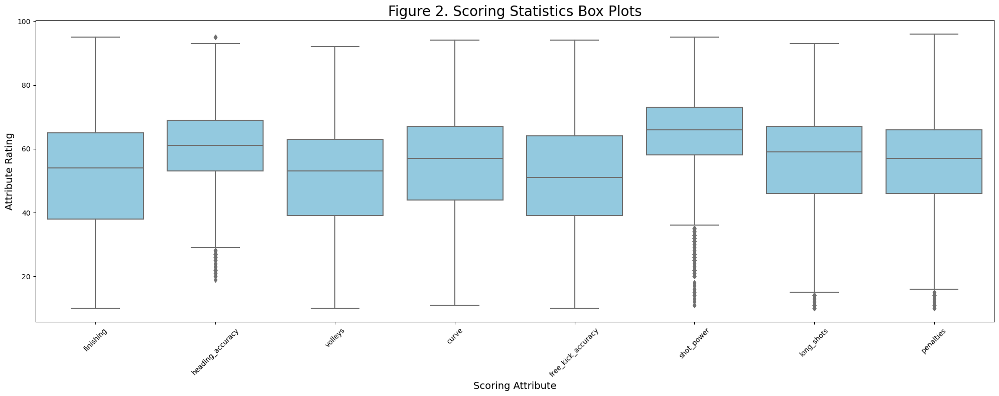

In [27]:
scoring_stats = df_player[['finishing', 'heading_accuracy', 'volleys',
                           'curve', 'free_kick_accuracy', 'shot_power',
                           'long_shots', 'penalties']]
title = 'Figure 2. Scoring Statistics Box Plots'
plot_scoring_stats(scoring_stats, title)

Key insights on player scoring stats (Refer to Figure 2.)

##### **Median and Quartile Distribution**:
* The median varies significantly across different attributes, suggesting that players' proficiency in these scoring abilities is quite diverse. For example, attributes like `shot_power` and `heading_accuracy` might have higher medians compared to `volleys` and `curve`, indicating a generally higher proficiency or emphasis in those areas among players.

##### **Interquartile Range (IQR)**:
* A larger IQR in `shot_power` and `heading_accuracy` indicates greater variability in player abilities within that middle 50%, while a smaller IQR suggests more consistency among players. Attributes with a wider IQR might indicate that those skills vary more significantly among players, potentially reflecting specialized training or natural aptitude.

##### **Outliers**:
* The presence of outliers highlights players with scoring abilities that are significantly above or below the norm for specific attributes. For instance, outliers in `long_shots` and `free_kick_accuracy` could represent players with exceptional talent in these areas, possibly making them valuable targets for teams seeking such specific skills.

##### **Comparison Across Attributes**:
* Comparing across different scoring attributes, it's evident that some attributes like `shot_power` and `heading_accuracy` not only have higher medians but also exhibit a wide range of values (as seen in the spread of their boxes and whiskers). This could suggest that while many players possess these abilities to some degree, a distinct subset has exceptionally high or low ratings, highlighting potential areas for scouting.
* Conversely, attributes with tighter distributions and fewer outliers, such as `curve` and `penalties`, might indicate skills that are more uniformly distributed among players, suggesting these are common skills developed to a similar level by most players.

##### **Strategic Insights for Teams**:
* Teams looking to bolster their offensive capabilities might focus on players who are outliers in finishing, long shots, or free-kick accuracy, as these players could provide a competitive edge in scoring from various play situations.
* The variability in `volleys` and `curve` could be of particular interest for teams seeking players with a knack for precision and creativity in their shots, offering a tactical advantage in breaking down defensively robust teams.

<h3 style="color: navy;">A.2 Passing</h3>

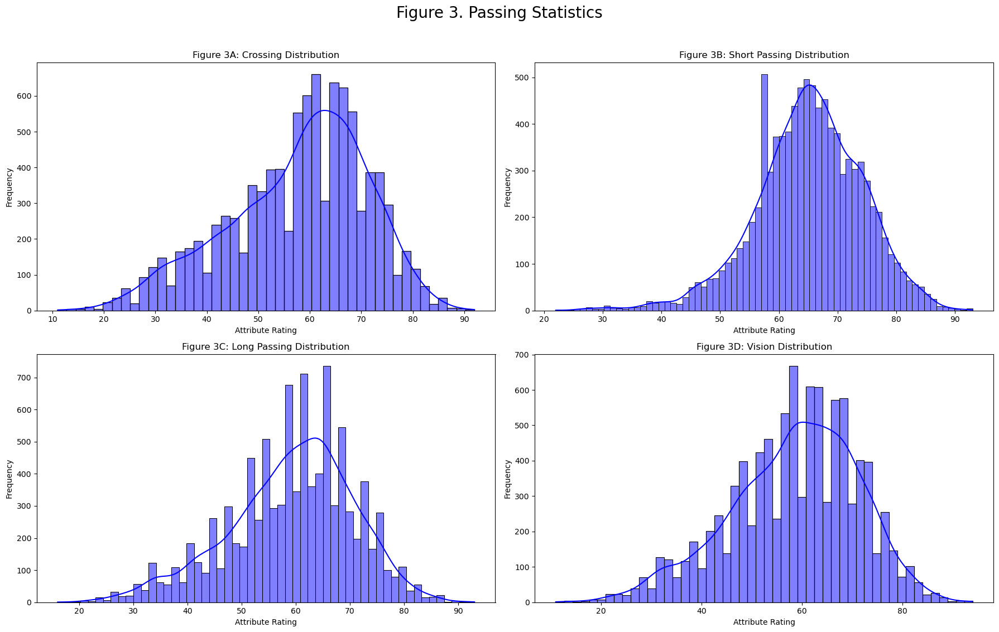

In [28]:
passing_stats = df_player[['crossing', 'short_passing', 
                           'long_passing', 'vision']]
plot_passing_stats(passing_stats, 3)

##### **Crossing**
* The distribution of the `crossing` attribute shows a wide range of skills among players, with a slight skew towards higher ratings. This suggests that many players possess good crossing abilities, which are essential for creating scoring opportunities from wide areas (Refer to Figure 3A.).

##### **Short Passing**
- `Short_passing` appears to be one of the most uniformly distributed attributes, with the majority of players having high ratings. This indicates that short passing is a fundamental skill well-developed among players, reflecting its importance in maintaining possession and building attacks (Refer to Figure 3B).

##### **Long Passing**
- The `long_passing` attribute shows variability in player abilities, with a concentration of players having mid-to-high ratings. This skill is crucial for transitioning play and creating long-range attacking opportunities, and the distribution suggests a mix of specialization among players (Refer to Figure 3C).

##### **Vision**
- `Vision` represents a player's ability to spot a pass and make strategic decisions. The distribution here shows a range of abilities, with a significant number of players possessing high vision ratings. High vision is key for playmakers and those involved in orchestrating attacks (Refer to Figure 3D).

##### **General Insights**
- Across all attributes, the presence of players with high ratings indicates a pool of talent capable of effective passing play. The distributions suggest that while certain skills like short passing are widely possessed at a high level, others like long passing and vision show more variability, highlighting potential areas for targeted recruitment or development.
- The kde (Kernel Density Estimate) lines overlaid on the histograms provide a smooth representation of the data distribution, further emphasizing the central tendencies and variability within each attribute.

<h3 style="color: navy;">A.3 Skills/IQ Statistics</h3>

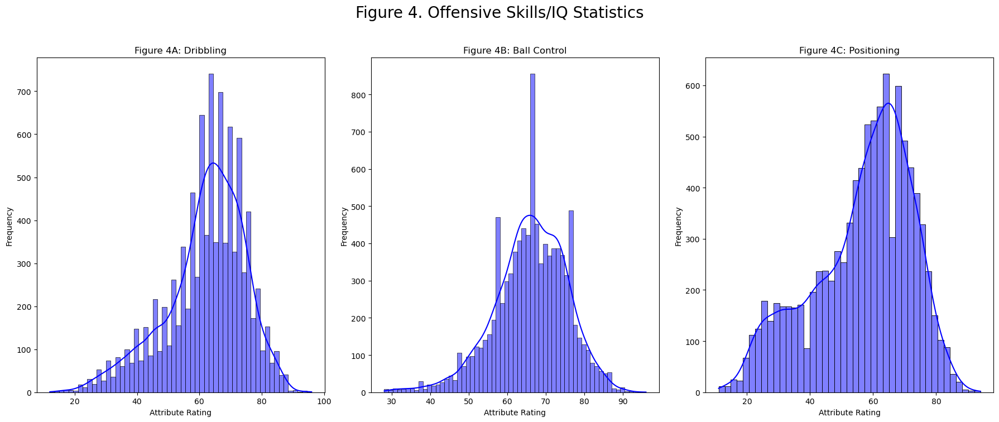

In [29]:
off_skillIQ_stats = df_player[['dribbling', 'ball_control', 
                               'positioning',]]
plot_off_skillIQ_stats(off_skillIQ_stats, 4)

##### **Dribbling**
- The distribution of `dribbling` skills among players shows a broad range, with a significant concentration of players possessing high dribbling ratings. This suggests that dribbling, a key skill for offensive play, is well-developed among many players, enabling them to navigate through defenses effectively (Refer to Figure 4A).

##### **Ball Control**
- `Ball control` is another critical attribute that appears to be highly rated across the player base, with the distribution skewed towards higher values. High ball control is essential for maintaining possession and executing precise movements, indicating a widespread proficiency in this skill among the players (Refer to Figure 4B).

##### **Positioning**
- The `positioning` attribute, which reflects a player's ability to be in the right place at the right time, especially in offensive situations, shows a wide distribution of ratings. The spread suggests variability in this cognitive aspect of play, highlighting players who excel in anticipating play developments and finding optimal positions (Refer to Figure 4C).

##### **General Insights**
- Across these attributes, the presence of high ratings in dribbling and ball control indicates a strong technical foundation among the players, which is vital for effective offensive play.
- The variability in positioning skills suggests differences in players' understanding of the game and spatial awareness, which could be pivotal in creating scoring opportunities.
- These distributions can help teams identify players with exceptional offensive skills and IQ, which are crucial for breaking down opposing defenses. Players with high ratings in these areas might be particularly valuable for roles that require creativity, precision, and tactical awareness.

<h2 style="color: navy;">B. Defensive Attributes</h2>

<h3 style="color: navy;">B.1 Defensive Statistics</h3>

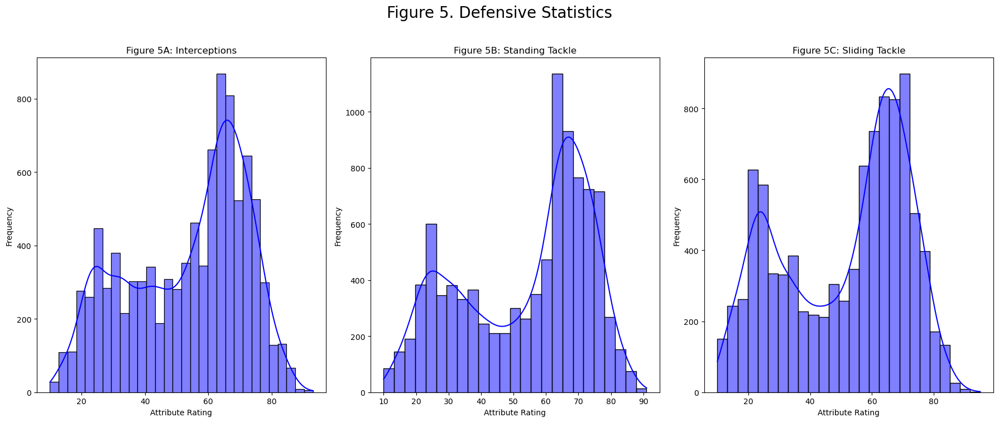

In [30]:
def_stats = df_player[['interceptions', 'standing_tackle', 
                       'sliding_tackle']]
plot_def_stats(def_stats, 5)

##### **Interceptions**
- The distribution of `interceptions` shows a broad range of skills, with a notable concentration of players possessing mid-to-high ratings. This indicates a widespread ability among players to anticipate and intercept passes, a key aspect of effective defensive play (Refer to Figure 5A).

##### **Standing Tackle**
- `Standing tackle` abilities also display a wide distribution, emphasizing the variability in players' proficiency in winning the ball in standing challenges. The skew towards higher ratings suggests that many players are well-equipped to execute standing tackles, a fundamental defensive skill (Refer to Figure 5B).

##### **Sliding Tackle**
- The `sliding tackle` attribute shows a similar distribution to standing tackle, with a diversity in skill levels among players. The presence of players with high ratings indicates specialized defensive capabilities, particularly in executing tackles that require precise timing and technique (Refer to Figure 5C).

##### **General Insights**
- The distributions highlight the range of defensive skills within the dataset, pointing to a mix of generalists and specialists in defensive play. Players with high ratings in these attributes are likely key defensive assets for their teams, capable of disrupting opponents' offensive actions effectively.
- The variability in these distributions also underscores the potential for targeted training and development, as teams might seek to enhance specific defensive skills among their players.
- Identifying players with exceptional defensive abilities could be crucial for teams prioritizing defensive solidity and looking to strengthen their back line or midfield defensive duties.

<h3 style="color: navy;">B.2 Skills/IQ Statistics</h3>

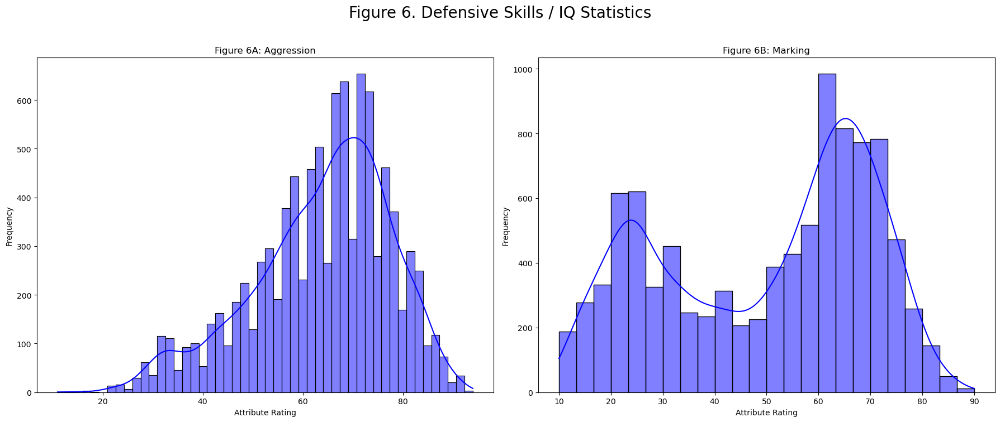

In [31]:
def_skillIQ_stats = df_player[['aggression', 'marking']]
plot_def_skillIQ_stats(def_skillIQ_stats, 6)

##### **Aggression**
- The distribution of `aggression` shows that a significant number of players possess high aggression ratings, indicative of a strong defensive mindset. High aggression can be advantageous in pressing, tackling, and contesting for the ball, suggesting that many players are proactive in defensive engagements (Refer to Figure 6A).

##### **Marking**
- `Marking` skills exhibit a wide distribution, with many players showcasing mid-to-high ratings. This attribute is essential for closely guarding opponents and preventing them from receiving the ball in dangerous positions. The spread in the marking distribution highlights the variability in players' ability to effectively mark opponents, which is critical for team defensive strategies (Refer to Figure 6B).

##### **General Insights**
- The presence of high ratings in aggression suggests a pool of players with the tenacity and intensity required for robust defensive play, potentially making them valuable assets for teams seeking to enhance their defensive pressure and ball recovery capabilities.
- The variability in marking abilities points to differences in players' tactical understanding and spatial awareness, emphasizing the importance of scouting for players who excel in this area to improve defensive solidity.
- These distributions can assist coaching staff and management in identifying players with the defensive skills and IQ necessary for their tactical setups, as well as in targeting training efforts to develop these attributes further within their squads.

<h2 style="color: navy;">C. Physical Statistics</h2>

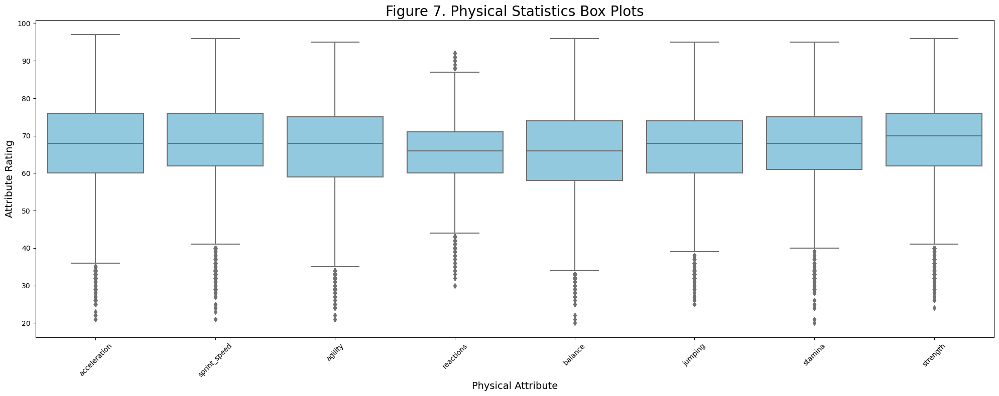

In [32]:
physical_stats = df_player[['acceleration', 'sprint_speed',
                            'agility', 'reactions', 'balance',
                            'jumping', 'stamina', 'strength',]]
plot_physical_stats(physical_stats, 7)

This visualization will help in understanding the physical capabilities and conditioning of the players in the dataset (Refer to Figure 7).

##### **Insights from the Physical Statistics Box Plots**

- **Variability and Range**: The box plots display a wide range of values for each physical attribute, highlighting the diversity in physical capabilities among players. Attributes like `acceleration` and `sprint_speed` show a concentration of high ratings, indicating a pool of players with excellent speed and quickness.

- **Median Values**: The median line within each box plot indicates that the central tendency for most attributes is towards the higher end of the scale. This suggests that the majority of players possess good to excellent physical abilities.

- **Outliers**: The presence of outliers in attributes like `jumping` and `strength` suggests that some players have exceptionally high or low ratings compared to the majority. These outliers could represent specialized physical traits that set certain players apart.

- **Interquartile Range (IQR)**: The IQR varies across different attributes, indicating the level of variability within each. Attributes with a narrower IQR, such as `reactions`, suggest more uniformity among players in those areas, while a wider IQR indicates greater diversity.

##### **Strategic Implications for Teams**

- **Identifying Physical Strengths and Weaknesses**: The distribution of physical attributes can help teams identify players with exceptional physical qualities that match their tactical needs. For instance, teams needing speed on the wings might focus on players with high `acceleration` and `sprint_speed`.

- **Recruitment and Scouting**: The insights from these plots can inform recruitment strategies by highlighting the physical attributes that are most common or rare among players, guiding scouts towards targeting players with the desired physical profiles.

<a id='Header2'></a>
<h1 style="color:#ffffff; background-color:#001f3f; padding: 20px 0; text-align: left; font-weight: bold; padding-left: 20px;">VII. METHOD IMPLEMENTATION</h1><a id='ExecSum'></a><a id='Title'></a><a

<h2 style="color: navy;">A. Methodology Overview</h2>

<center><b>Figure 8. </b>Methodology Flow Chart</center><center>

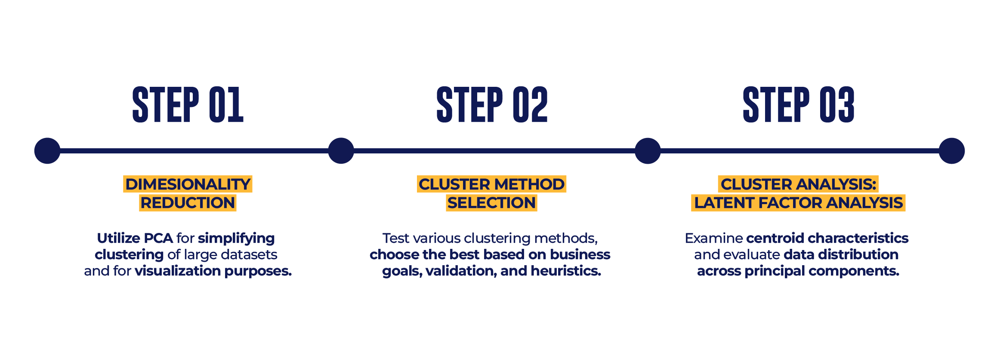

Before proceeding, the team highlights the three step aspect of the methodology of this project to guide the readers' understanding and flow (Refer to Figure 8). 

- **`STEP 1:`** The initial step involves performing dimensionality reduction using PCA on the dataset, motivated by two key reasons: Firstly, the team condensed the data to enhance manageability when applying clustering techniques. Methods like Ward's Method and KMedioids struggle with large datasets, necessitating the reduction of dataset size. Secondly, employing PCA facilitates visualization and insight extraction from the clusters. This approach enabled the team to collectively label data points, centroids, and clusters.
- **`STEP 2:`** Following the transformation of the dataset into its reduced form, the team utilized various clustering techniques. These included two representative-based methods (KMeans and KMedoids), four hierarchical clustering techniques (Single Linkage, Complete Linkage, Average Linkage, and Ward's Method), and one density-based method (OPTICS-DBSCAN). The selection of the optimal model is based on considerations of business objectives, validation statistics, and heuristics.
- **`STEP 3:`** After applying the most effective clustering technique to the data points, the team utilized the most distinguishing features that characterize the centroids to establish definitive labels for each cluster. Subsequently, PCA was employed to visualize the clustered data points, demonstrating how these clearly labeled clusters exhibit promise in other attributes. This indicates their potential as all-around players capable of performing effectively at both ends of the field.

<h2 style="color: navy;">B. Implementation</h2>

<h3 style="color: navy;">B.1 Dimensionality Reduction</h3>

The choice to employ dimensionality reduction stems from the extensive scale of the dataset, comprising 9661 rows and 29 columns. Executing clustering on the entire dataset would be time-consuming. Hence, the team opts for PCA to condense the dimensions, rendering it more tractable. The objective is to attain an 81% cumulative variance explained which creates a good balance in reducing the dataset while at the same time retaining the important information.

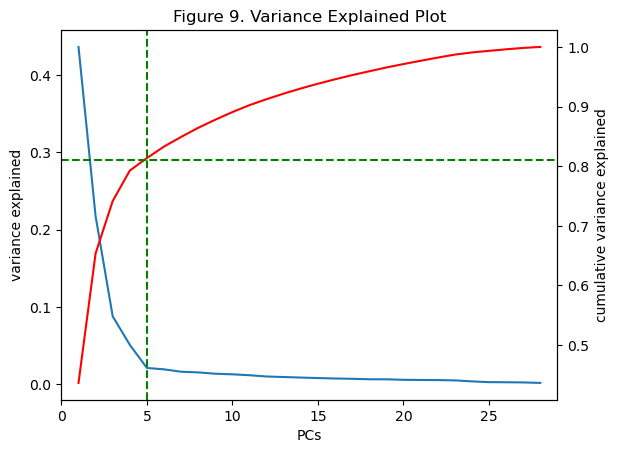

In [33]:
# Dimensionality Reduction
data = df_player.drop(columns='player_name').to_numpy()
pca = PCA(n_components=28)
test_pca = pca.fit_transform(data)
variance_explained = pca.explained_variance_ratio_

# Plot Variance Explained
title = 'Figure 9. Variance Explained Plot'
plot_ve(variance_explained, title)

Based on the plot above (Refer to Figure 9), the vertical and horizontal broken lines intersect at 5 principal components. This achieves the initial goal of attaining an 81% cumulative variance explained.

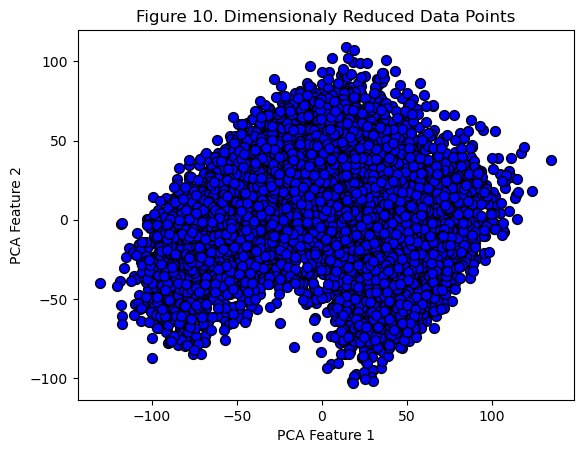

In [34]:
# PCA for visualization
X_player = df_player.drop(columns='player_name')
player_pca = PCA(n_components=5, random_state=1337)
X_player_new = player_pca.fit_transform(X_player)
components = player_pca.components_.T

plt.scatter(X_player_new[:, 0], X_player_new[:, 1],
            color='blue', edgecolor='black', s=50,)

plt.title('Figure 10. Dimensionaly Reduced Data Points')
plt.xlabel('PCA Feature 1')
plt.ylabel('PCA Feature 2')
plt.show()

<h3 style="color: navy;">B.2 Method Comparison /  Hyperparameter Tuning </h3>

To identify the most appropriate method, the team employed various clustering techniques, accompanied by their respective indicator plots. The models outlined below exemplify the optimal approach within each clustering type, facilitating a detailed comparison to determine the most suitable method for the dataset. Here's an overview of each model:

<h4 style="color: navy;">B.2.1 Representative-based Clustering: KMeans Clustering</h4>

The team opted for KMeans over KMedoids for several reasons. Firstly, KMeans is more efficient with our extensive dataset. Even though it has been reduced, employing KMedoids would consume a considerable amount of time. Secondly, KMeans generates centroids that do not represent actual players. Given the current trend in the football world towards a position-less game, associating centroids with real players might introduce biases in cluster labeling. Lastly, KMeans yields comparable results to KMedoids, but its alignment with our business objectives makes it the preferred choice.

`Note:` Please do note that the team ran KMedoids which produced promising clustering results at k = 3 (Refer to Appendix 1). However, due to the size of the dataset, it was not possible for the team to run the internal validation statistics as the team is pressed for time.

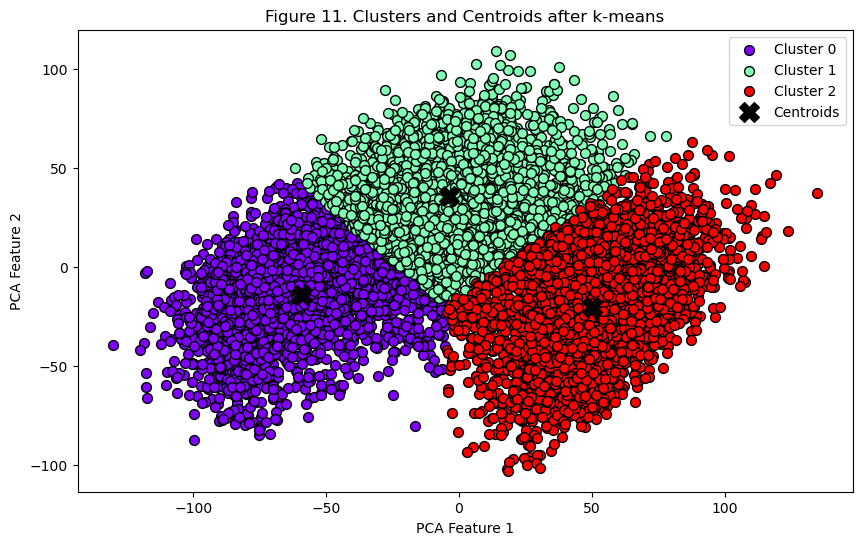

In [35]:
title = 'Figure 11. Clusters and Centroids after k-means'
kmeans_player, kmeans_clusters = run_kmeans(X_player_new, 3, title)

Upon initial inspection of the clustering above, grouping the data points into sets of three appears to produce clusters that exhibit characteristics of high quality. Despite being densely packed, the clusters demonstrate clear separation. Moreover, they exhibit balance in terms of the distribution of data points assigned to each cluster (Refer to Figure X).

In [36]:
res_player = cluster_range(X_player_new, kmeans_player, 2, 15)

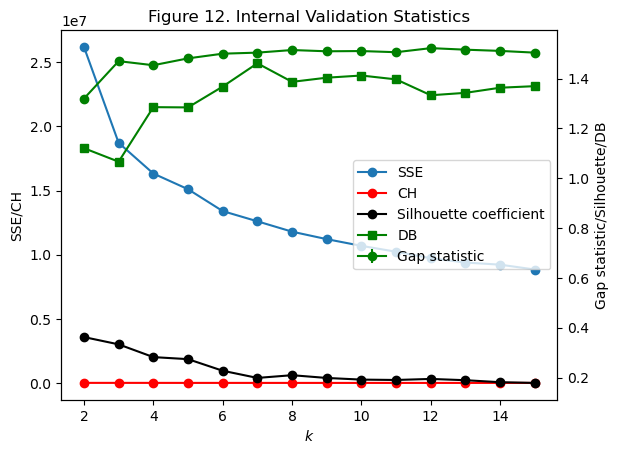

In [37]:
title = 'Figure 12. Internal Validation Statistics'
plot_internal(
    res_player["inertias"],
    res_player["chs"],
    res_player["scs"],
    res_player["dbs"],
    res_player["gss"],
    res_player["gssds"], title
);

The internal validation statistics indicate two potential values for 'k': k = 2 and k = 3 (See Figure 12). These candidates were selected based on various statistics, including the sum of squared distances to centroids, Calinski-Harabasz index, Silhouette coefficient, Davies-Bouldin index, and Gap statistic. To gain further insight into selecting the most suitable candidate, each statistic was plotted individually below.

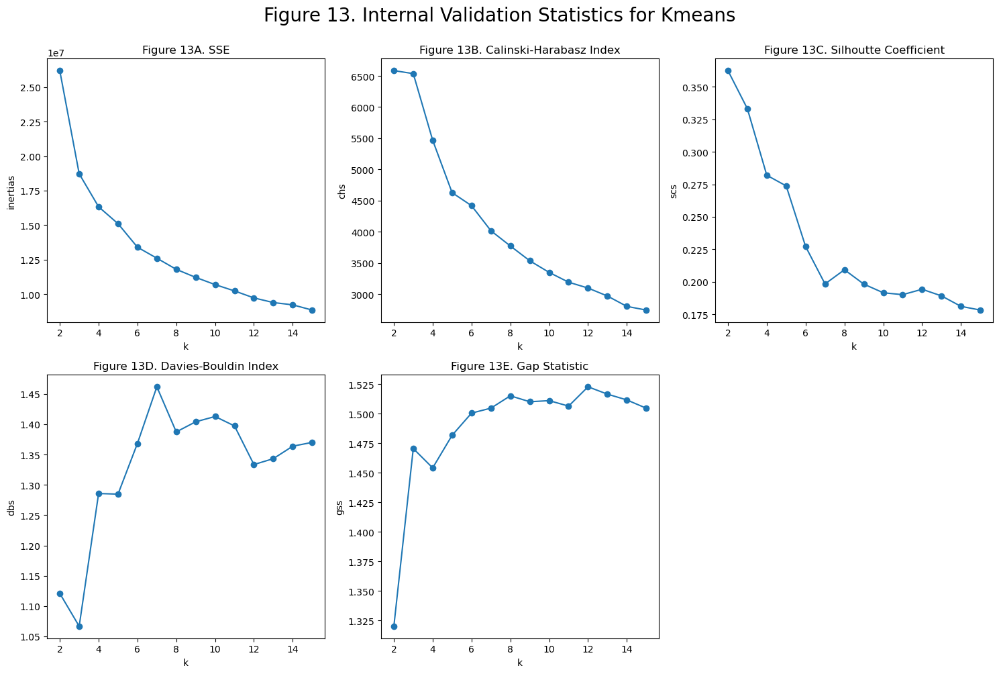

In [38]:
axis_plot(res_player, 13)

Establishing the context for the discussion, the team has determined the optimal number of clusters for KMeans clustering to be 3. This decision is grounded in the following rationale:

* `SSE:` Utilizing the elbow method, the point of inflection appears to occur at k = 3. There is a noticeable decrease in the sum of squares distance from the centroids from k = 2 to 3. Beyond k = 3, the reduction becomes marginal, indicating diminishing returns (Refer to Figure 13A).

* `Calinsky-Harabsz Index:` This statistic aims for maximization. Consequently, the highest value occurs at k = 2. However, k = 3 closely follows, with a negligible difference between them, making the choice relatively interchangeable (Refer to Figure 13B).

* `Silhoutte Coefficient:` Similar to the Calinski-Harabasz Index, the Silhouette Coefficient also requires maximization, with the distinction that this statistic is bounded between -1 to 1. From the plot, it appears that the optimal choice should be k = 2 (Refer to Figure 13C).

* `Davies-Bouldin Index:` The optimal number of clusters according to the Davies-Bouldin Index is determined by minimizing it. As indicated by the plot, this occurs at k = 3 (Refer to Figure 13D).

* `Gap Statistic:` According to the gap statistic method, the optimal k-value is determined by maximizing the statistic, which occurs at k = 12. However, the disparity between k = 3 and k = 15 is minimal, suggesting that their gap statistics, despite being distinct, can be considered relatively constant. Adhering to the principle of parsimony, the lowest number of clusters that deliver comparable performance should be selected, which in this case is k = 3 (Refer to Figure 13E).

In summary, the choice to select k = 3 is primarily influenced by the convergence of multiple statistics indicating its suitability. Specifically, three out of the five statistics—SSE, Calinski-Harabasz Index, and Davies-Bouldin Index—clearly advocate for this option.

<h4 style="color: navy;">B.2.2 Heirarchical Clustering: Ward's Method</h4>

The team tried multiple heirarchical clustering methods, but it is discovered that Ward's Method produced superior results. Below are some detailed discussions and insightful plots.

`Note:` Please note that the team examined three additional hierarchical clustering methods in addition to Ward's Method. These methods include 'Single Linkage', 'Average Linkage', and 'Complete Linkage' (Refer to Appendix 2, 3, 4, 5, 6, and 7).

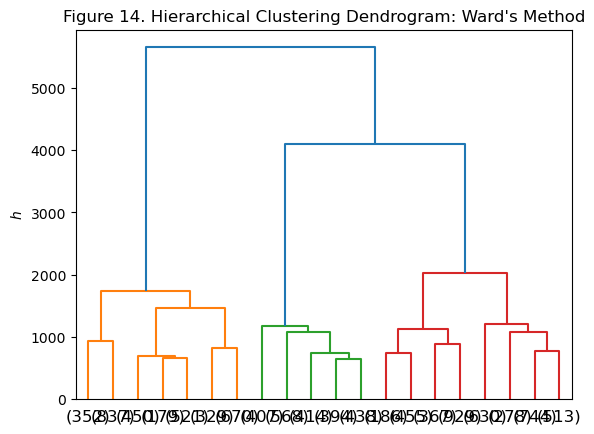

In [39]:
title = "Figure 14. Hierarchical Clustering Dendrogram: Ward's Method"
run_heirarchical(X_player_new, 'ward', title)

The dendrogram generated by Ward's Method of hierarchical clustering suggests two potential candidates: grouping the data points into either two or three clusters. This determination is made by selecting a threshold that lies between the largest distance separating two branch platforms. Upon visual examination, it appears that this threshold is located at 3,000, dividing the dendrogram into three distinct clusters (Refer to Figure 14).

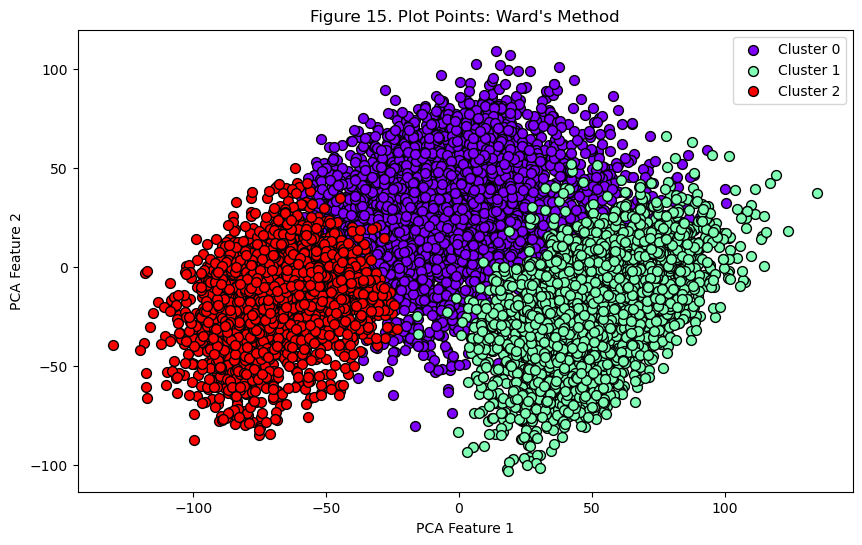

In [40]:
title = "Figure 15. Plot Points: Ward's Method"
plot_clustered_points(X_player_new, 3, 'ward', title)

The depicted plot illustrates the clusters generated following the application of Ward's Method of clustering. While the results exhibit resemblances to the clustering achieved by KMeans, it is evident that they are not superior. Firstly, there is overlap between the clusters, with certain green and red data points encroaching into the purple cluster. Secondly, there appears to be an imbalance in the distribution of data points among the clusters (Refer to Figure 15). 

It's important to note that these observations are based solely on the first two principal components.

<h4 style="color: navy;">B.2.3 Density-based Clustering: OPTICS-DBSCAN</h4>

The team opted to solely employ OPTICS-DBSCAN to represent density-based clustering, foregoing the utilization of other methods such as DBSCAN and automated OPTICS. This decision was driven by the systematic process involved in determining the optimal hyperparameters for OPTICS-DBSCAN. Before initiating clustering, a reachability plot is generated to aid in selecting the ideal threshold/epsilon value. In contrast, determining values for the other methods is more visual, subjective, and less guided.

Automated OPTICS was excluded due to its reliance on trial and error for achieving optimal clustering, which may lead to inefficiencies. Similarly, DBSCAN was not utilized because the use case does not provide clear guidelines for determining ideal hyperparameters. Consequently, selecting epsilon and minimum points relies on a heuristic approach that is not as systematic and guided as in OPTICS-DBSCAN.

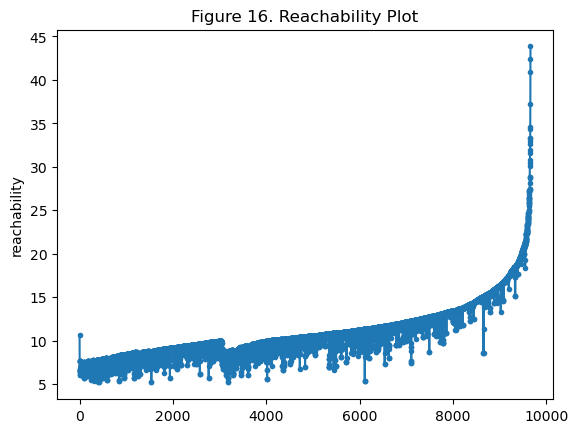

In [41]:
title = 'Figure 16. Reachability Plot'
optics = reachibility_plot(X_player_new, title)

As anticipated, the reachability plot reveals a single large valley. Density-based clustering hinges on density variations within the dataset. However, due to the close proximity of data points in this particular dataset, they are essentially clustered into a single group. This outcome may also be attributed to the nature of the data points, which are standardized and bounded, with multiple players sharing different skill attributes. Consequently, the clustering algorithm amalgamates these data points into a singular blob. In summary, it appears that density-based clustering might not be well-suited to the characteristics of this dataset, as it typically performs better with irregularly shaped data, which is not the case here (Refer to Figure 16).

Number of clusters: 1
Number of noise points: 15
Number of points in the largest cluster: 9646
Number of points: 9661
Silhouette score: 0.30585111290600714


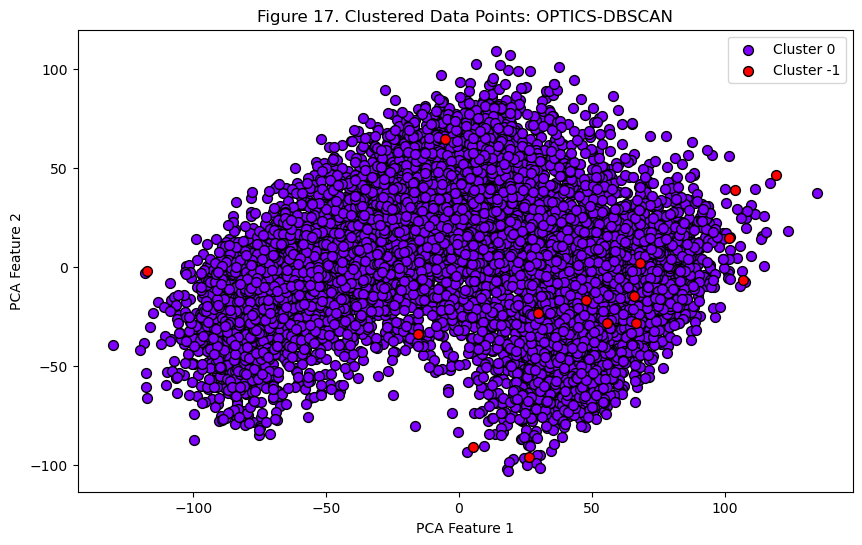

In [42]:
title = 'Figure 17. Clustered Data Points: OPTICS-DBSCAN'
plot_optics_points(optics, 29, title)

The plot resulting from OPTICS-DBSCAN clustering reveals a single large cluster with a small number of outlier data points. Within this cluster, there are 9,646 data points, while 15 data points are identified as outliers. Additionally, the clustering yields a silhouette score of 0.31 (Refer to Figure 17). These outcomes are suboptimal, as previously discussed in the analysis of the reachability plot (Refer to Figure 16).

<h2 style="color: navy;">C. Results and Discussion</h2>

<h3 style="color: navy;">C.1 Results of Chosen Clustering Method</h3>

Upon comparing the outcomes of the clustering techniques discussed above, KMeans emerges as the most effective. This is evidenced by its ability to generate the most discernible clusters, even upon visual inspection of the data points plotted on the first two principal components. Additionally, KMeans aligns seamlessly with the objectives outlined in the technical report. Specifically, it facilitates the initial definition of clusters using a representative approach and enables the identification of indicators of position-less football. This involves pinpointing players classified under one role who possess the skills and potential to transition into a different role.

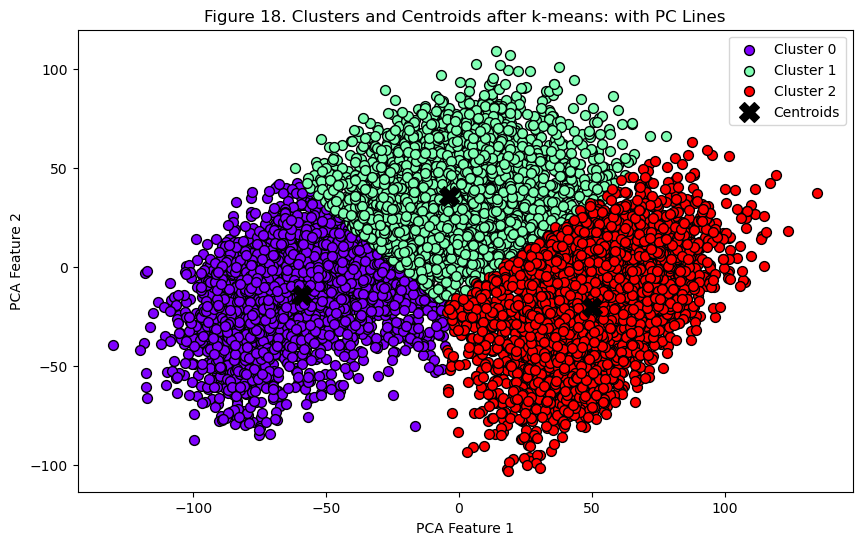

In [43]:
title = 'Figure 18. Clusters and Centroids after k-means: with PC Lines'
run_kmeans(X_player_new, 3, title)
plt.show()

As previously mentioned, KMeans indicates the presence of three balanced and well-separated clusters (see Figure 18). 

Exploring how Principal Components provide context to the clustered data points, it becomes evident that the first Principal Component (PC) is crucial. Placing a vertical line at the 0 value of the x-axis effectively divides cluster 0 and cluster 2, yet intersects precisely at the midpoint of cluster 1. 

However, the second principal component does not cleanly distinguish between the clusters, failing to separate cluster 1 from both cluster 0 and 2. This serves as a noteworthy indicator to discuss the trend of positionless football in 2016, where players exhibit versatility across different roles.

<h3 style="color: navy;">C.1.1 Name and Label Clusters</h3>

To establish definitive and consistent labels for the clusters, the team will utilize the attributes or features associated with the centroids of each cluster. In essence, the centroids will serve as the defining characteristics of each cluster.

In [44]:
centroids = player_pca.inverse_transform(kmeans_player.cluster_centers_)
sorted_centroids = np.argsort(centroids)[:, ::-1]
features = df_player.drop(columns='player_name').columns

df_clusters = pd.DataFrame(columns=[f'Feature {i}' for i in range(1, 11)])

for cluster in range(len(sorted_centroids)):
    top_features = [features[i] for i in sorted_centroids[cluster, :10]]
    df_clusters.loc[f'Cluster {cluster}'] = top_features
print('Table 4. Features Strongly Associated with Centroids')
display(df_clusters)

Table 4. Features Strongly Associated with Centroids


,Feature 1,Feature 2,Feature 3,Feature 4,Feature 5,Feature 6,Feature 7,Feature 8,Feature 9,Feature 10
Cluster 0,strength,aggression,standing_tackle,jumping,sliding_tackle,marking,interceptions,stamina,heading_accuracy,reactions
Cluster 1,stamina,short_passing,ball_control,aggression,reactions,shot_power,strength,agility,long_passing,balance
Cluster 2,acceleration,sprint_speed,agility,shot_power,ball_control,dribbling,balance,positioning,finishing,reactions


`Cluster 0 (Purple data points):` The initial cluster centroid represents attributes typically associated with defenders, including full backs, half backs, and sweepers. These players tend to display high ratings in tackling, marking, and interceptions, which are direct defensive statistics. Additionally, they often demonstrate proficiency in jumping and heading accuracy, as these skills are frequently utilized during corner kicks, where defenders may contribute to scoring opportunities (Refer to Table 4).

`Cluster 1 (Green data points):` The second cluster centroid embodies statistics closely resembling those of midfielders. These players exhibit a combination of various statistics but excel particularly in passing attributes and outside shooting, given their positioning in the middle of the field, farther from the goals. As indicated by the features of the centroids, attributes such as short passing and long passing are defining characteristics of this cluster. Moreover, the inclusion of shot power and ball control supports the identification of these players as midfielders, suggesting their propensity to shoot from outside the box and their ability to maintain possession to create plays (Refer to Table 4).

`Cluster 2 (Red data points):` The final cluster centroid represents attacking players, specifically strikers and wings, who specialize in advancing the ball towards the goal. Key attributes associated with these players include shot power and finishing, reflecting their primary objective of scoring goals. Additionally, these players are typically agile and adept at maneuvering to create scoring opportunities. Features such as sprint speed, balance, acceleration, positioning, and ball control serve as strong indicators that these players indeed fulfill the role of strikers (Refer to Table 4).

<h3 style="color: navy;">C.1.2 Indicators of Position-less Football</h3>

The labels established in the previous section serve as a reference, suggesting that each cluster corresponds to a specific role, including defensive, offensive, or midfield. With this understanding, let us examine the distribution of data points across the principal components. This analysis will reveal whether players assigned to distinct roles demonstrate potential to assume another role or possess attributes indicative of an all-around player.

Text(0.5, 1.0, 'Figure 19. Principal Component 1')

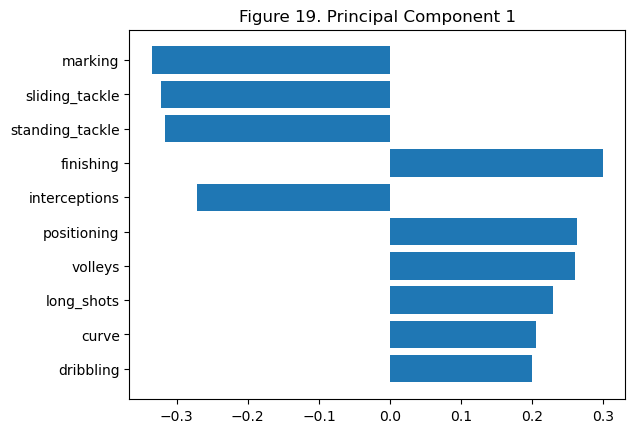

In [45]:
features = X_player.columns.to_numpy()
fig, ax = plt.subplots()
order = np.argsort(np.abs(components[:, 0]))[-10:]
ax.barh([features[o] for o in order], components[order, 0])
ax.set_title(f'Figure 19. Principal Component {1}')

Negative values along the first principal component axis are associated with defensive attributes, while positive values are linked to scoring and ball handling statistics which are marks of offensive players (Refer to Figure 19). To illustrate, if a data point falls on the negative side of the principal component, it suggests that the player has a defensive skillset. Conversely, if the data point is located on the positive side, the player is more inclined towards an offensive skillset.

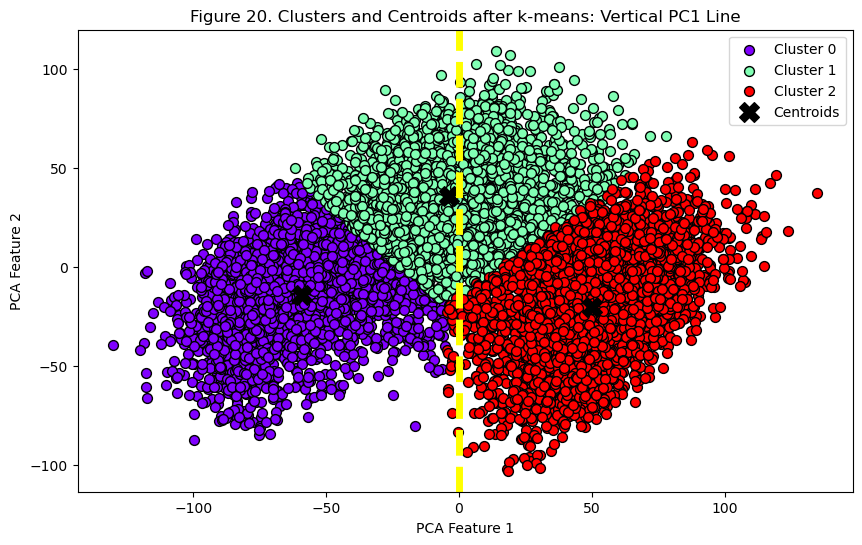

In [46]:
title = 'Figure 20. Clusters and Centroids after k-means: Vertical PC1 Line'
run_kmeans(X_player_new, 3, title)
plt.axvline(0, ls='--', color='yellow', linewidth=5)
plt.show()

Analysis of the first principal component (PC1) does not reveal any new information about the data points. The majority of offensive players, as classified by the centroids, are positioned towards the right end of PC1, while the same holds true for defensive players. However, it is noteworthy that a few offensive players (depicted by red data points) lie on the boundary of the vertical line of PC1. This indicates that some of these players classified as offensive exhibit proficiency in defensive skillsets, suggesting an opportunity to transition towards the midfield, where defensive skills are more frequently utilized compared to near the opposing team's goal (Refer to Figure 20).

Another noteworthy observation is the even distribution of players classified as midfielders around the midpoint of the PC1 vertical line. This suggests that some midfielders exhibit skills more aligned with offensive players, while others lean towards defensive attributes (Refer to Figure 20).

`Implications to Scouting and Player Development:` Coaches and trainers can leverage this information to identify players suitable for transitioning to specific roles within the team. Additionally, scouts can utilize this data to broaden their pool of potential recruits. For example, if there is a shortage of midfielders in the market but a surplus of strikers displaying potential as defenders, the team can consider recruiting these players. Their well-rounded skillset suggests they could excel in a midfield role, contributing effectively to the team's needs.

Text(0.5, 1.0, 'Figure 21. Principal Component 2')

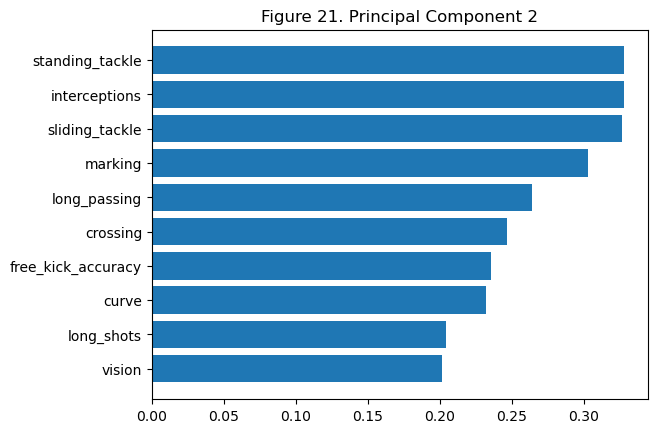

In [47]:
features = X_player.columns.to_numpy()
fig, ax = plt.subplots()
order = np.argsort(np.abs(components[:, 1]))[-10:]
ax.barh([features[o] for o in order], components[order, 1])
ax.set_title(f'Figure 21. Principal Component {2}')

The main features associated with positive values of the second principal component (PC2) depict players as versatile and well-rounded, proficient in various aspects of the game like defending, attacking, and creating opportunities, resembling midfielders known for their multifaceted abilities. Notably, these players exhibit strong attributes in tackling, passing, and scoring. In contrast, negative values of PC2 suggest a different profile, with players specializing more on offensive skills while lacking in defensive contributions (Refer to Figure 21).

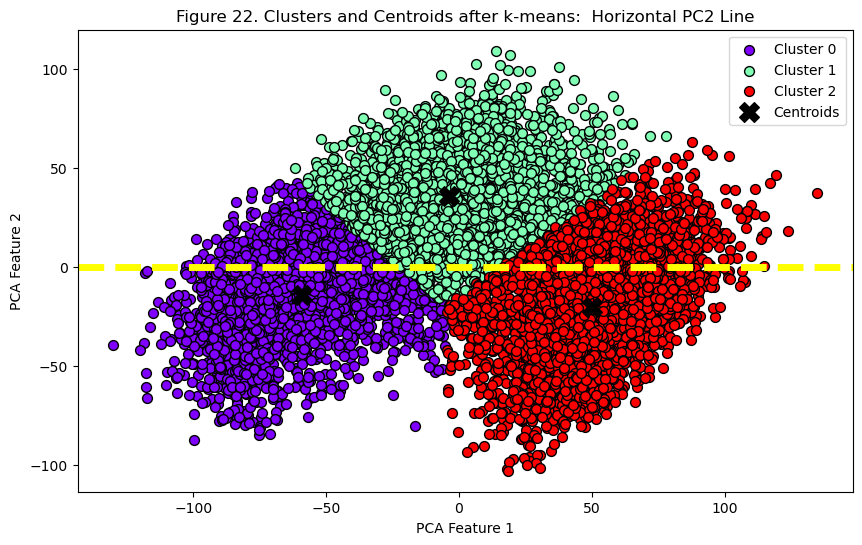

In [48]:
title = 'Figure 22. Clusters and Centroids after k-means:  Horizontal PC2 Line'
run_kmeans(X_player_new, 3, title)
plt.axhline(0, ls='--', color='yellow', linewidth=5)
plt.show()

As expected, players considered all-around (with positive values of PC2) are typically midfielders (green data points), displaying strong qualities in both the offensive and defensive sides of football. Interestingly, however, a significant number of players tagged as offensive (red data points) and defensive (purple data points) are seen crossing the PC2 horizontal line and moving into positive PC2 values. This implies that some offensive players exhibit prowess in the defensive end, while some defensive players showcase exceptional passing and scoring skills (Refer to Figure 22).

This trend suggests that players are evolving into versatile athletes capable of seamlessly transitioning between different positions on the field. It reflects the concept of sports moving towards a position-less era, where traditional roles are becoming less rigid. Players are increasingly interchangeable, possessing similar skill sets that allow them to contribute effectively across various areas of the game (Refer to Figure 22).

`Implication to Scouting and Player Development:` The emergence of all-around players presents a positive outlook for scouts, showcasing the versatility and flexibility of athletes available for selection. These all-around players, often referred to as "unicorns," offer teams the opportunity to develop them into specific roles as needed. This adaptability is particularly advantageous for coaches employing diverse football strategies and formations, as these players can effectively fulfill a variety of positions and responsibilities on the field.

<a id='Header2'></a>
<h1 style="color:#ffffff; background-color:#001f3f; padding: 20px 0; text-align: left; font-weight: bold; padding-left: 20px;">VIII. CONCLUSION</h1><a id='ExecSum'></a><a id='Title'></a><a

This section is reserved to summarize the findings and implications already discussed in the methodology implementation and the discussion of results of report:

<h2 style="color: navy;">A. General Findings</h2>

KMeans clustering yielded optimal results as the clusters demonstrated key attributes of effective clustering: they were compact, well-separated, and balanced. Moreover, the decision to partition them into three groups was supported by internal validation metrics.

Three distinct labels were assigned to the clusters based on the centroids. The first cluster pertains to defenders, the second to midfielders, and the third to offensive players.

When plotted on the first two principal components, the clustered data points reveal the existence of versatile or adaptable players who can potentially be acquired or trained to perform roles beyond their assigned ones. 
* Analyzing the impact of the first principal components on the data points reveals that some offensive players possess defensive capabilities, suggesting their potential transition to midfield roles. Similarly, certain midfielders exhibit preferences for either defensive or offensive skills, indicating their versatility to transition into striker or defensive positions.
* The second principal component indicates that some players labeled as offensive or defensive demonstrate characteristics of all-around players, often referred to as 'unicorns'.

<h2 style="color: navy;">B. Implications to the Team (Scouting, Coaching, Player Development)</h2>

Drawing connections between the findings and the business objective, here are several implications of the results for a football team:

`Implication on Scouting`: The outcome of this project is a player pool contextualized by their positions on the PCA axis. Each player (data point) is categorized as either a specialist (focused solely on offense or defense), a unicorn (possessing versatile skills), or flexible (capable of transitioning to different yet specialized role). This aids in strategizing player acquisitions in the transfer market to align with team needs or evolving strategies.

`Implications on Coaching`: Recognizing the potential for all-around players, coaches can utilize this information to devise more adaptable formations. The all-around players identified in this study become targets for coaches as they can fulfill various roles that correspond to multiple formations, a capability not afforded by specialists in the squad.

`Implications to Player Development`: This study identifies alternative options to the initial player targets in the transfer market. Consequently, the team can select a substitute player with promising skill sets and develop them into the desired position. For instance, if the team seeks a midfielder but faces a shortage of options in the market, they can acquire a striker or winger exhibiting defensive potential and subsequently convert them into a midfielder.

`Implications on Overall Team Strategy and Development`: Training programs should be adapted to develop such multifaceted skill sets in players, and scouting processes should prioritize versatility as a key attribute. Further, team strategies could be designed to capitalize on this fluidity by creating dynamic formations that allow players to interchange roles seamlessly during a match.

<a id='Header2'></a>
<h1 style="color:#ffffff; background-color:#001f3f; padding: 20px 0; text-align: left; font-weight: bold; padding-left: 20px;">IX. LIMITATIONS AND RECOMMENDATIONS</h1><a id='ExecSum'></a><a id='Title'></a><a

<h2 style="color: navy;">A. Limitations</h2>

**`Data Challenges:`** The team encountered challenges with certain variables that exhibited input anomalies, prompting a collective decision to exclude these variables out of concern for their potential adverse impact on the analytical process. The implications of this exclusion remain uncertain, as it is possible that these variables may have held significant relevance to our findings. The dataset was further refined by eliminating records that contained any missing values, resulting in a dataset with complete information across all fields. Prior to this data cleansing step, it was observed that a number of attributes (volleys, curve, agility, balance, jumping, vision, sliding_tackle) each had precisely 436 instances of missing data, suggesting that the missing entries were likely associated with a specific subset of players for whom this information was not captured.
 
**`Lack of Qualitative Considerations:`** The limitation stemming from an exclusive reliance on numerical data is that it inherently omits the qualitative aspects of a player's impact, which are not readily quantifiable but are nonetheless pivotal to their overall contribution to a team. For instance, a player's leadership and morale-boosting presence within the locker room can be instrumental in team cohesion and performance, yet these attributes are seldom captured in datasets. Recognizing and integrating these intangible elements is crucial, as they can have a substantial and sometimes decisive influence on both individual and team success.
 
**`Fixed Time Aspect of the Project:`** The inherently dynamic and evolving nature of football presents a challenge for any analytical model that relies on historical data. Player roles and team strategies continuously adapt over time, meaning that a model developed using data from previous seasons might not fully capture or anticipate future tactical innovations or shifts in the way the game is played. Consequently, strategies derived from such a model might not align with current or emergent trends in the sport. In this study, the scope was limited to player ratings from the 2015 to 2016 period, which constrains the analysis to the tactical context and player performance standards of that specific timeframe. This limitation highlights the potential for the model's relevance to diminish over time as the game evolves, underscoring the importance of periodically updating the model with new data to maintain its accuracy and applicability.
 
**`Reliance on First Two PCs for Analysis:`** Incorporating only the first two principal components (PCs) in the analysis introduces another limitation. While these components account for the largest variance within the dataset, they do not encompass the entire spectrum of variability. Subsequent principal components, though individually contributing less to the variance, may collectively encapsulate critical aspects of the data that the first two components do not capture. By relying solely on two dimensions for clustering and interpretation, there is a risk of oversimplifying the data's complexity, potentially overlooking subtle but informative patterns. This reductionist approach may lead to incomplete or biased insights into player abilities and characteristics, as multidimensional traits could be compressed into a two-dimensional view. Consequently, important strategic decisions made on the basis of this analysis might miss out on the nuanced understanding that additional components could provide. It is, therefore, crucial to balance dimensionality reduction with the retention of meaningful information, which might necessitate the inclusion of more than just the first two principal components, especially in a multifaceted domain such as football where player performance is multi-dimensional.

<h2 style="color: navy;">B. Recommendations</h2>

**`Collect Data from Different Time Periods:`** To address the fluid nature of football, consider a time-sensitive analysis that can capture the evolution of the game. This could involve a year-on-year analysis or incorporating data from more recent seasons to understand how player roles, skill levels, and effectiveness may have changed.
 
**`Explore or Dive Deeper on other Use Cases of the Study:`** To expand upon this study, future researchers may investigate alternative applications for its results. While the team has exclusively noted the implications for scouting, coaching, and player development, there could be further potential in areas such as fantasy football, betting platforms, and game development.
 
**`Expand Dataset to Cover International Leagues (Asia, Middle-east, etc.):`** To enrich the analytical depth and broaden the scope of insights into player performance and potential, it is recommended to extend the current player pool beyond its European focus. By incorporating players from diverse leagues, regions, and club development schools globally, the analysis would benefit from a richer dataset reflective of a wide array of playing styles, tactical approaches, and player development philosophies. This expansion would not only enhance the robustness of comparative analyses but also uncover unique talents and strategies employed across different football cultures. For instance, incorporating players from South American leagues could reveal different skill sets and tactical innovations, while players from Asian or African academies might offer insights into varied developmental focuses and physical attributes. Furthermore, this broader dataset could aid in identifying underrepresented or emerging markets for talent scouting, providing a competitive edge in player recruitment.
 
**`Engage with Subject Matter Experts (SMEs) to Validate Finding and Extract More Insights:`** Involving SMEs in football analytics is critical for contextualizing statistical findings within the real-world nuances of the sport. These experts can validate data-driven clusters against established tactical knowledge, ensuring that insights are tactically sound and actionable. Their experience allows for the translation of complex data patterns into strategies that resonate with coaching and management teams. SMEs also help in identifying emerging trends and guiding future data collection efforts, improving the predictive power of analytical models. Ultimately, their input is vital for ensuring that the analytical outcomes are relevant, accurate, and capable of informing practical decision-making in football.

**`Outlier Analysis on Players:`** After conducting data exploration, the team recognizes the presence of outliers among players regarding their skill sets. These outliers may exhibit exceptional abilities that significantly surpass or fall below the average of the group. For example, Cristiano Ronaldo stands out as an outlier in terms of physical attributes, particularly his jumping ability and strength. As such, it is recommended that further investigation be conducted on this aspect, as it falls beyond the scope of the current project.

<a id='Header2'></a>
<h1 style="color:#ffffff; background-color:#001f3f; padding: 20px 0; text-align: left; font-weight: bold; padding-left: 20px;">X. APPENDIX</h1><a id='ExecSum'></a><a id='Title'></a><a

<h2 style="color: navy;">A. Clustering Method Testing</h2>

<h3 style="color: navy;">A.1 KMedoids</h3>

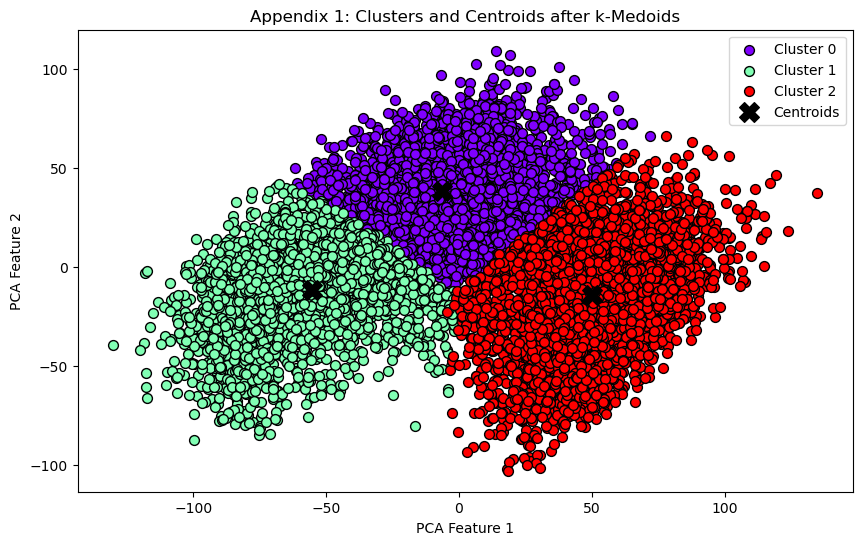

In [49]:
title = 'Appendix 1: Clusters and Centroids after k-Medoids'
kmedoids_player, kmedoids_clusters = run_kmedoids(X_player_new, 3, title)

<h3 style="color: navy;">A.2 Heirarchical Clustering: Single Linkage</h3>

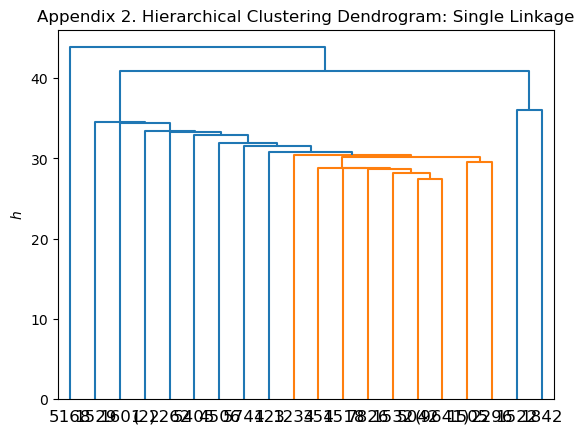

In [50]:
title = "Appendix 2. Hierarchical Clustering Dendrogram: Single Linkage"
run_heirarchical(X_player_new, 'single', title)

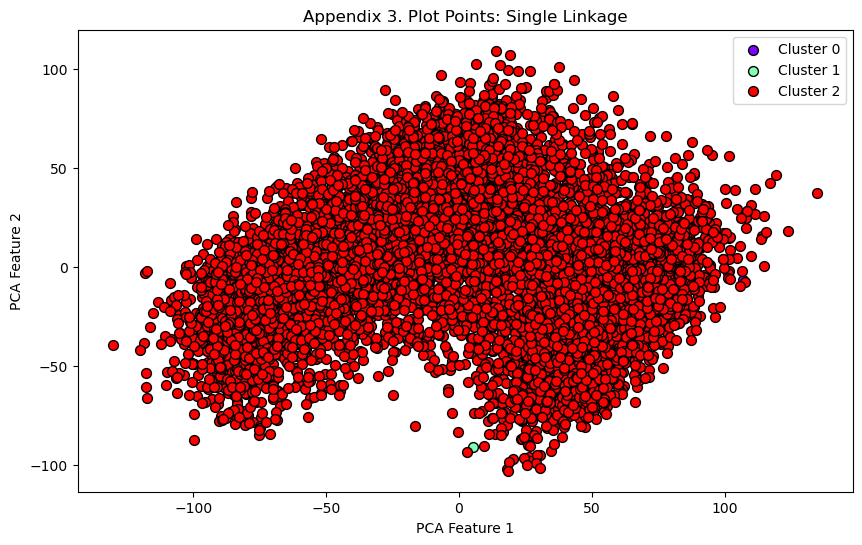

In [51]:
title = "Appendix 3. Plot Points: Single Linkage"
plot_clustered_points(X_player_new, 3, 'single', title)

<h3 style="color: navy;">A.3 Heirarchical Clustering: Complete Linkage</h3>

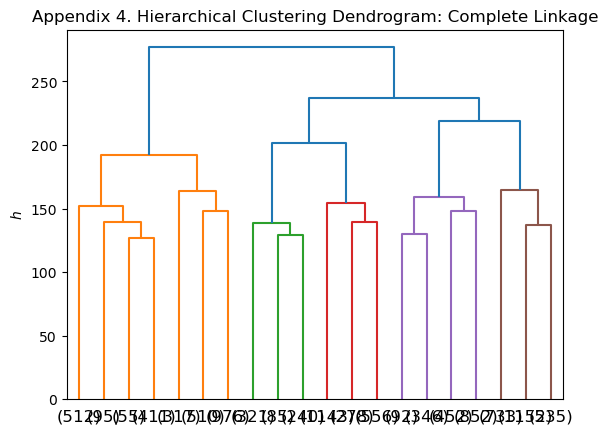

In [52]:
title = "Appendix 4. Hierarchical Clustering Dendrogram: Complete Linkage"
run_heirarchical(X_player_new, 'complete', title)

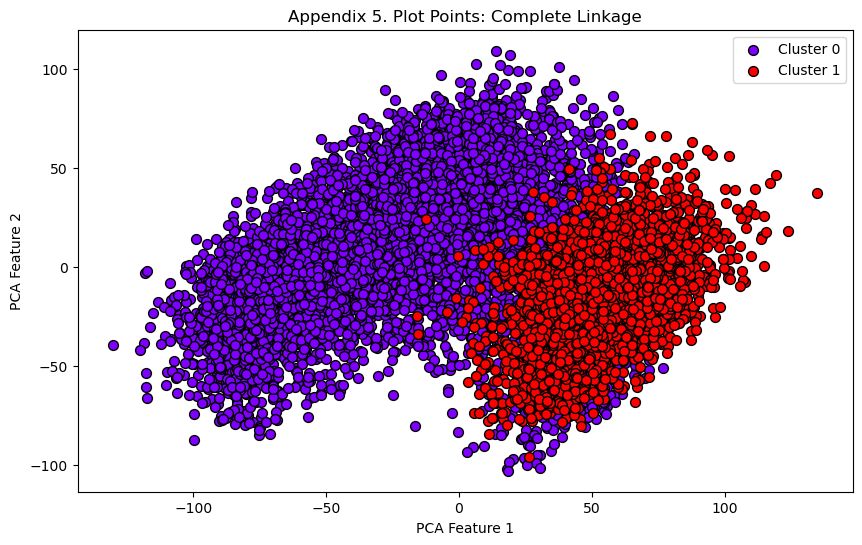

In [53]:
title = "Appendix 5. Plot Points: Complete Linkage"
plot_clustered_points(X_player_new, 2, 'complete', title)

<h3 style="color: navy;">A.4 Heirarchical Clustering: Average Linkage</h3>

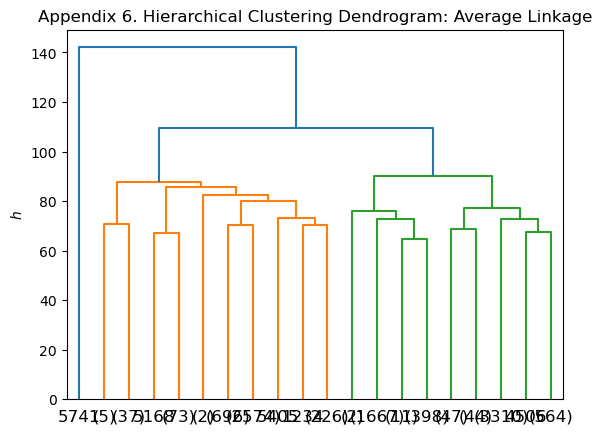

In [54]:
title = "Appendix 6. Hierarchical Clustering Dendrogram: Average Linkage"
run_heirarchical(X_player_new, 'average', title)

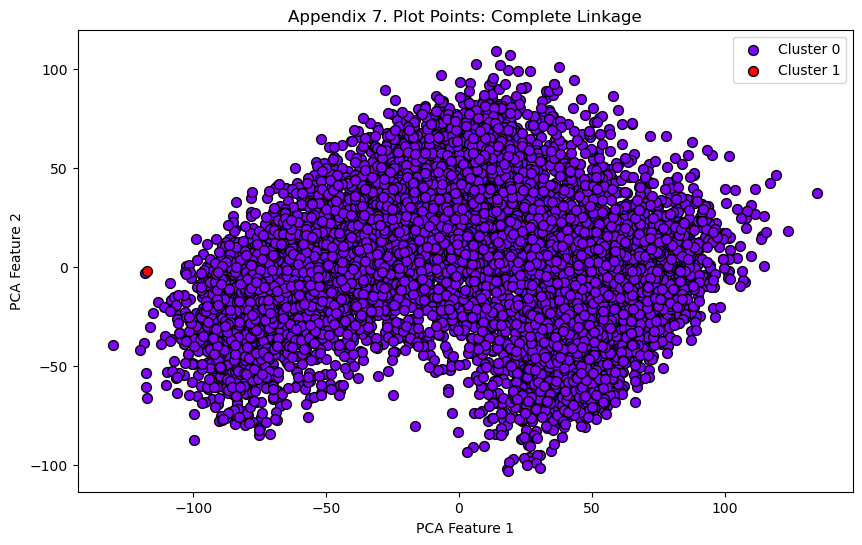

In [55]:
title = "Appendix 7. Plot Points: Complete Linkage"
plot_clustered_points(X_player_new, 2, 'average', title)

<a id='Header2'></a>
<h1 style="color:#ffffff; background-color:#001f3f; padding: 20px 0; text-align: left; font-weight: bold; padding-left: 20px;">XI. REFERENCES</h1><a id='ExecSum'></a><a id='Title'></a><a

Note that ChatGPT was used for the following for grammar checks and brainstorming. No ideas were directly copied from it.

OpenAI. (2024). Conversation on "PCA Analysis on Positionless Football" with OpenAI's ChatGPT Personal interview. 12 February 2023.